In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
import seaborn as sns
import matplotlib.gridspec as gridspec
import copy as cp
import dash
from dash import dcc
from dash import html
from dash.dependencies import Input, Output
import dash_bootstrap_components as dbc
import plotly.graph_objects as go
import statsmodels.api as sm
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from collections import Counter
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
import datetime

In [2]:
df = pd.read_csv("preprocessed_data.csv")
df.head()

C:\Users\James\AppData\Local\Temp\ipykernel_17960\3576646626.py:1: DtypeWarning: Columns (2,3,4,5,10,11) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("preprocessed_data.csv")


,Unnamed: 0,Date,Location,Area,Classification,SubClassification,Requirement,FullDescription,LowestSalary,HighestSalary,ClassificationLumped,LocationLumped
0,0,2018-10-07 00:00:00+00:00,Sydney,North West & Hills District,Retail & Consumer Products,Retail Assistants,Our Casual Stock Replenishers pride themselves...,NaN,0,30,Retail & Consumer Products,Sydney
1,1,2018-10-07 00:00:00+00:00,Richmond & Hawkesbury,NaN,Retail & Consumer Products,Retail Assistants,Our Casual Stock Replenishers pride themselves...,NaN,0,30,Retail & Consumer Products,Other
2,2,2018-10-07 00:00:00+00:00,Brisbane,CBD & Inner Suburbs,Retail & Consumer Products,Retail Assistants,BRAND NEW FLAGSHIP STORE OPENING - SUNSHINE PLAZA,NaN,0,30,Retail & Consumer Products,Brisbane
3,3,2018-10-07 00:00:00+00:00,Gosford & Central Coast,NaN,Retail & Consumer Products,Retail Assistants,Bring it on - do you love the great outdoors a...,NaN,0,30,Retail & Consumer Products,Other
4,4,2018-10-07 00:00:00+00:00,Sydney,Ryde & Macquarie Park,Call Centre & Customer Service,Sales - Inbound,"We are seeking highly articulate, enthusiastic...",NaN,0,30,Call Centre & Customer Service,Sydney


In [3]:
#Had weird problem where saving dataset reset date to object type
df["Date"] = pd.to_datetime(df["Date"])

### Job Classification Visualisations

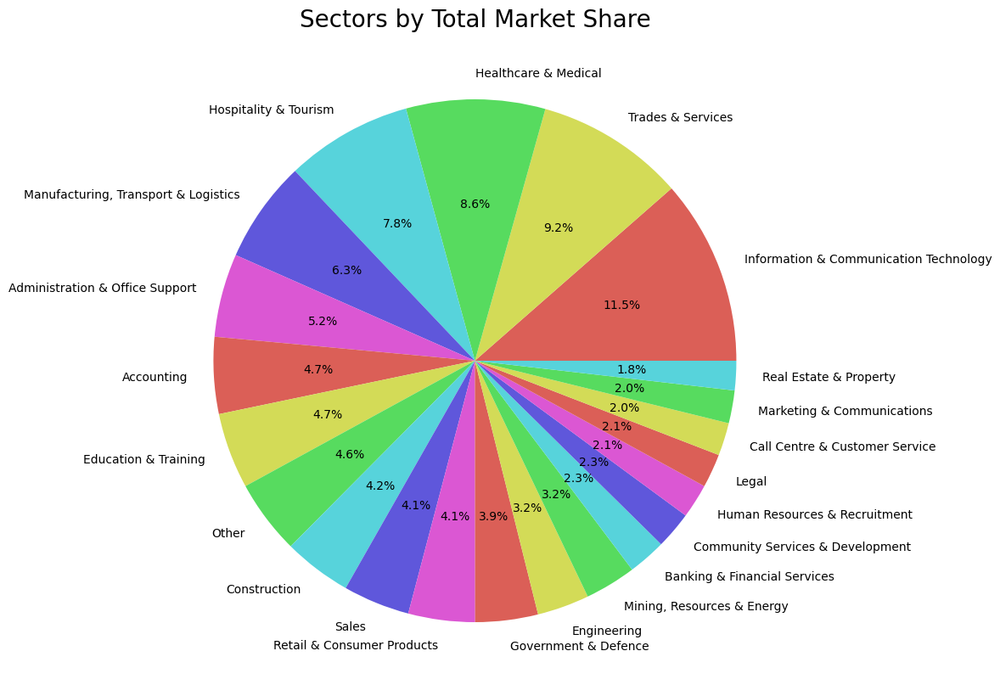

In [4]:
def split_label(label, max_length):
    words = label.split(' ')
    lines = []
    current_line = ''
    for word in words:
        if len(current_line + ' ' + word) <= max_length:
            current_line += ' ' + word
        else:
            lines.append(current_line)
            current_line = word
    lines.append(current_line)  # Don't forget the last line
    return '\n'.join(lines)
    
# Calculate the percentage of each classification
classification_counts = df['Classification'].value_counts()
classification_percentages = classification_counts / classification_counts.sum()

# Calculate the percentage of each Location
location_counts = df['Location'].value_counts()
location_percentages = location_counts / location_counts.sum()
colors = sns.color_palette("hls")

# Set the threshold for lumping small classifications
threshold = 0.01  # Set the threshold to 1% (0.01)
threshold2 = 0.008  # Set the threshold to 0.5% (0.008)

# Convert the classification percentages to a DataFrame
classification_percentages_df = pd.DataFrame(classification_percentages)
location_percentages_df = pd.DataFrame(location_percentages)

# Create a new column 'ClassificationLumped' based on the threshold
df['ClassificationLumped'] = df['Classification'].copy()
df.loc[df['Classification'].isin(classification_percentages_df[classification_percentages_df['Classification'] < threshold].index), 'ClassificationLumped'] = 'Other'
# Create a new column 'LocationLumped' based on the threshold
df['LocationLumped'] = df['Location'].copy()
df.loc[df['Location'].isin(location_percentages_df[location_percentages_df['Location'] < threshold2].index), 'LocationLumped'] = 'Other'

# Plot the pie chart
plt.figure(figsize=(10, 10))
df['ClassificationLumped'].value_counts().plot(kind='pie', autopct='%1.1f%%', colors=colors)
plt.title('Sectors by Total Market Share', fontsize=20)
plt.ylabel('')
plt.show()



Homemade function which plots bar of pie charts. <br>
Parameters:<br>
df - data frame<br>
category - the parent category<br>
subcategory - the subcategory you want to look at a slice from<br>
color_pallete - a seaborn color pallete for the plot<br>

In [5]:
def plot_bar_of_pie(df, category, slice, subcategory, color_palette):
    # Define the figure
    fig = plt.figure(figsize=(12, 7))

    # Define the grid
    gs = gridspec.GridSpec(2, 2, height_ratios=[3, 1]) 

    ax1 = plt.subplot(gs[:, 0])  # This makes the pie chart take up the left column
    ax2 = plt.subplot(gs[:, 1])  # This makes the bar chart take up the top row of the right column
    fig.subplots_adjust(wspace=0)
    # Define color palette
    colors = sns.color_palette(color_palette, 8)
    
    # Pie chart parameters
    overallRatios = df[category].value_counts(normalize=True).values.tolist()
    labels = df[category].value_counts(normalize=True).index.tolist()

    slice_index = labels.index(slice)  # Find the index of the slice

    explode = [0] * len(overallRatios)
    explode[slice_index] = 0.1  # Use slice_index to set the exploded slice

    # Only label the exploded slice
    labels = [split_label(l, 23) if i == slice_index else '' for i, l in enumerate(labels)]

    # Calculate the cumulative sums of the ratios (in degrees) up to each slice
    cumulative_ratios = np.cumsum(np.array(overallRatios) * 360)

    # The starting angle for the exploded slice is then 360 minus the cumulative sum up to that slice
    start_angle = 360 - cumulative_ratios[slice_index - 1] if slice_index > 0 else 0

    # Subtract half of the slice's angle from the starting angle
    start_angle -= (overallRatios[slice_index] * 360) / 2

    # Plot the pie chart with the new start angle
    wedges, *_ = ax1.pie(overallRatios, autopct='', startangle=start_angle,
                        labels=labels, explode=explode, colors=colors)


    # Bar chart parameters
    subClassificationRatios = df[df[category] == slice][subcategory].value_counts(normalize=True).values.tolist()
    subClassificationLabels = df[df[category] == slice][subcategory].value_counts(normalize=True).index.tolist()
    top = 0
    bottom = 1
    width = .2
    
    n = len(subClassificationRatios)
    alpha_increment = 0.9 / n
    
    # Adding from the top matches the legend.
    for j, (height, label) in enumerate(reversed([*zip(subClassificationRatios, subClassificationLabels)])):
        bottom -= height
        top += height
        color = colors[j % len(colors)]
        bc = ax2.bar(0, height, width, bottom=bottom, color=color, label=label, alpha=0.1 + alpha_increment * j)
        # Check if the height is >= 1%. If not, don't label it.
        if height >= 0.01:
            ax2.bar_label(bc, labels=[f"{height:.0%}"], label_type='center', color='black')
    
    ax2.legend()
    ax2.axis('off')
    ax2.set_xlim(-2.5 * width, 2.5 * width)
    ax2.legend(bbox_to_anchor=(.65, .95))
    
    # connect pie and bar
    slice_wedge = wedges[slice_index]  # Get the wedge at slice_index
    theta1, theta2 = slice_wedge.theta1, slice_wedge.theta2  # Use slice_wedge to get theta1 and theta2
    center, r = slice_wedge.center, slice_wedge.r  # Use slice_wedge to get center and r

    # draw top connecting line
    x = r * np.cos(np.pi / 180 * theta2) + center[0]
    y = r * np.sin(np.pi / 180 * theta2) + center[1]
    con = ConnectionPatch(xyA=(-width / 2, top), coordsA=ax2.transData,
                        xyB=(x, y), coordsB=ax1.transData)
    con.set_color([0, 0, 0])
    con.set_linewidth(1)
    ax2.add_artist(con)

    # draw bottom connecting line
    x = r * np.cos(np.pi / 180 * theta1) + center[0]
    y = r * np.sin(np.pi / 180 * theta1) + center[1]
    con = ConnectionPatch(xyA=(-width / 2, 0), coordsA=ax2.transData,
                        xyB=(x, y), coordsB=ax1.transData)
    con.set_color([0, 0, 0])
    ax2.add_artist(con)
    con.set_linewidth(1)
    
    x = r * np.cos(np.pi / 180 * theta1) + center[0]
    y = r * np.sin(np.pi / 180 * theta1) + center[1]

    con = ConnectionPatch(xyA=(-width / 2, 0), coordsA=ax2.transData,
                          xyB=(x, y), coordsB=ax1.transData)
    con.set_color([0, 0, 0])
    ax2.add_artist(con)
    con.set_linewidth(1)
    
    fig.suptitle(f'{subcategory}s within {slice}', fontsize=16, y=0.9)
    plt.rcParams['font.family'] = 'sans-serif'
    plt.rcParams['font.sans-serif'] = 'Arial'
    fig.patch.set_facecolor('white')
    
    plt.show()


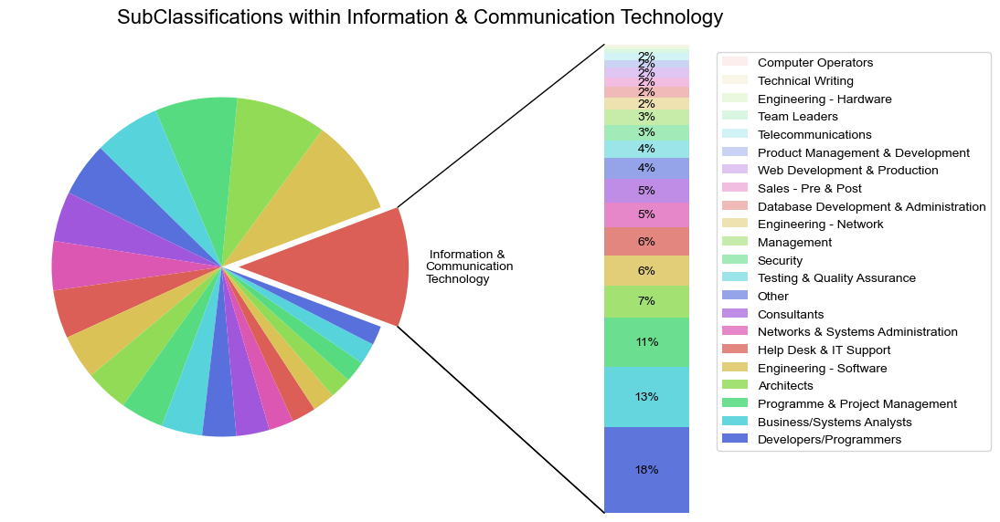

In [6]:
plot_bar_of_pie(df, 'ClassificationLumped', 'Information & Communication Technology', 'SubClassification', 'hls')

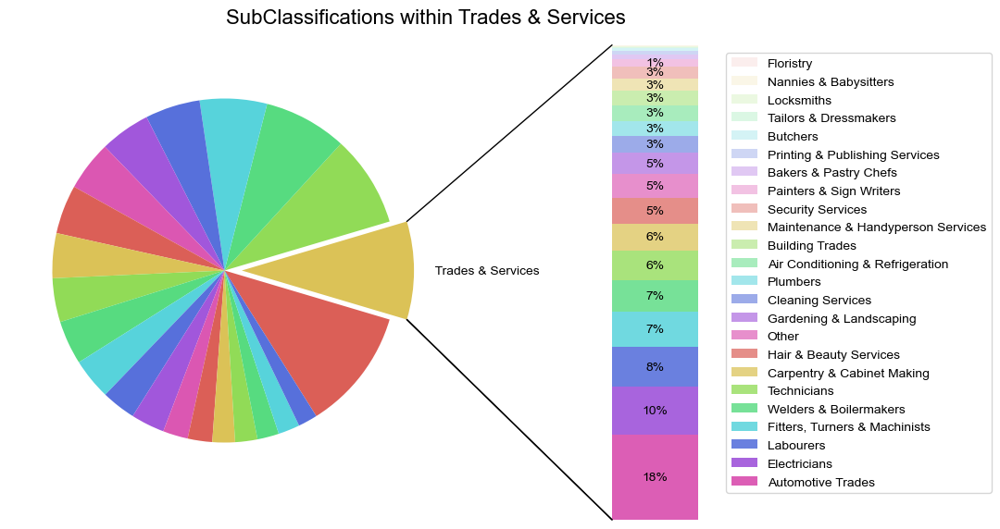

In [7]:
plot_bar_of_pie(df, 'ClassificationLumped', 'Trades & Services', 'SubClassification', 'hls')

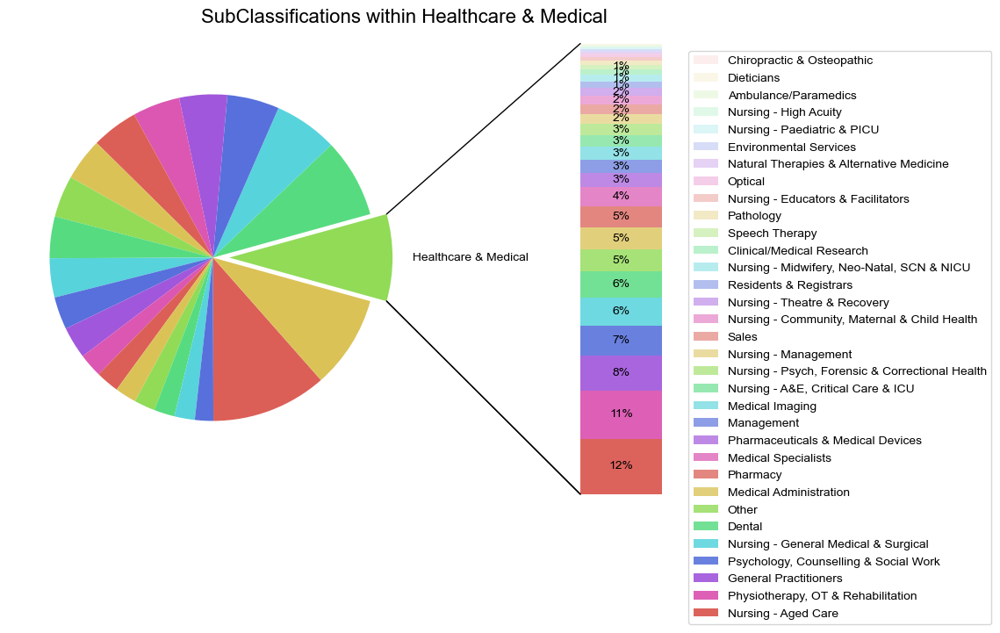

In [8]:
plot_bar_of_pie(df, 'ClassificationLumped', 'Healthcare & Medical', 'SubClassification', 'hls')

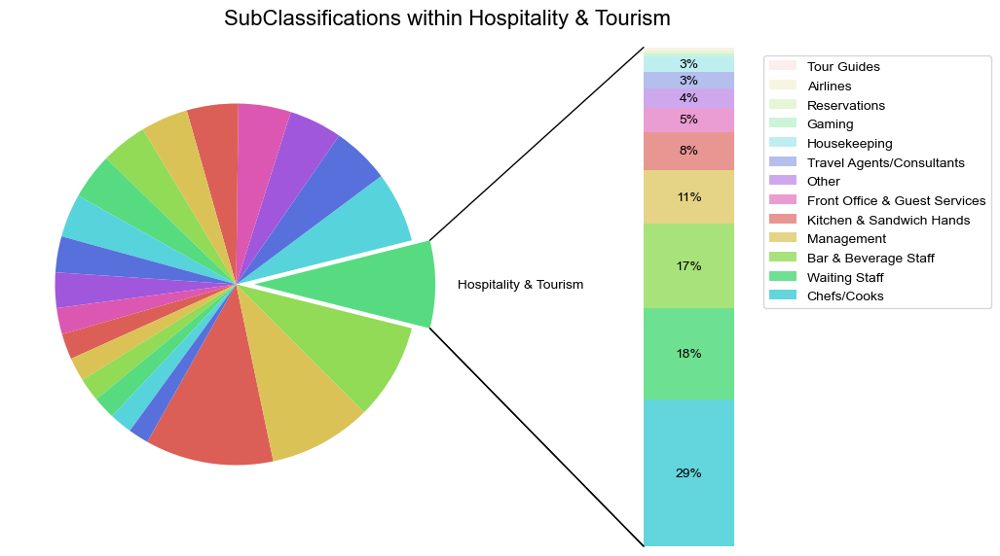

In [9]:
plot_bar_of_pie(df, 'ClassificationLumped', 'Hospitality & Tourism', 'SubClassification', 'hls')

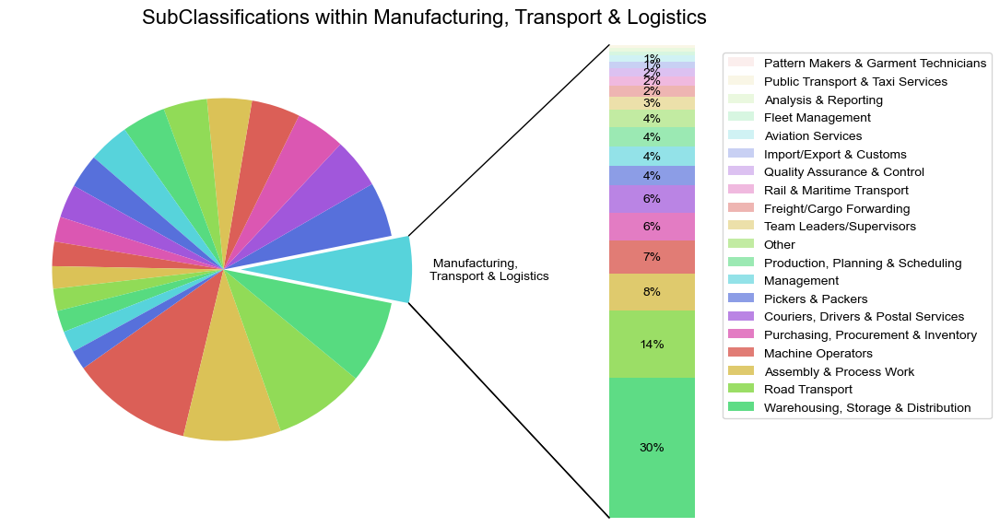

In [10]:
plot_bar_of_pie(df, 'ClassificationLumped', 'Manufacturing, Transport & Logistics', 'SubClassification', 'hls')

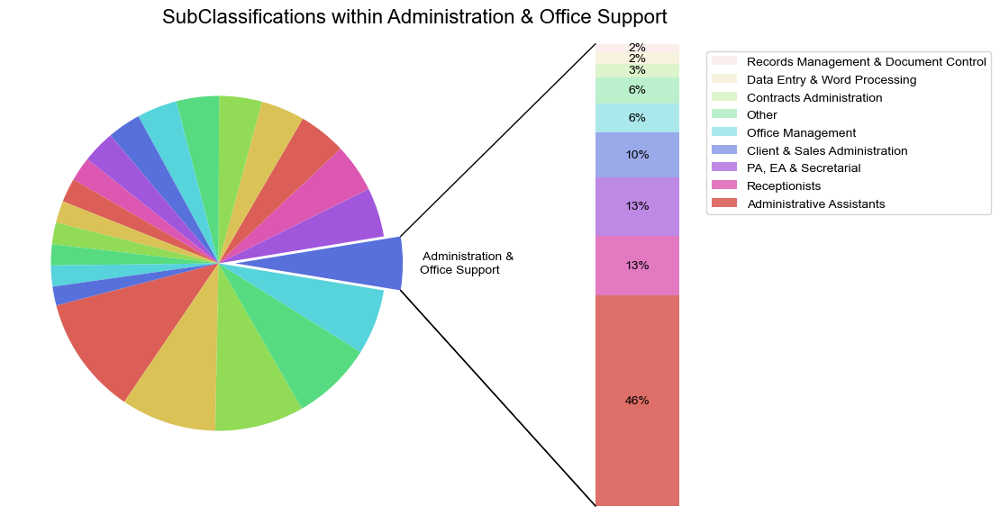

In [11]:
plot_bar_of_pie(df, 'ClassificationLumped', 'Administration & Office Support', 'SubClassification', 'hls')

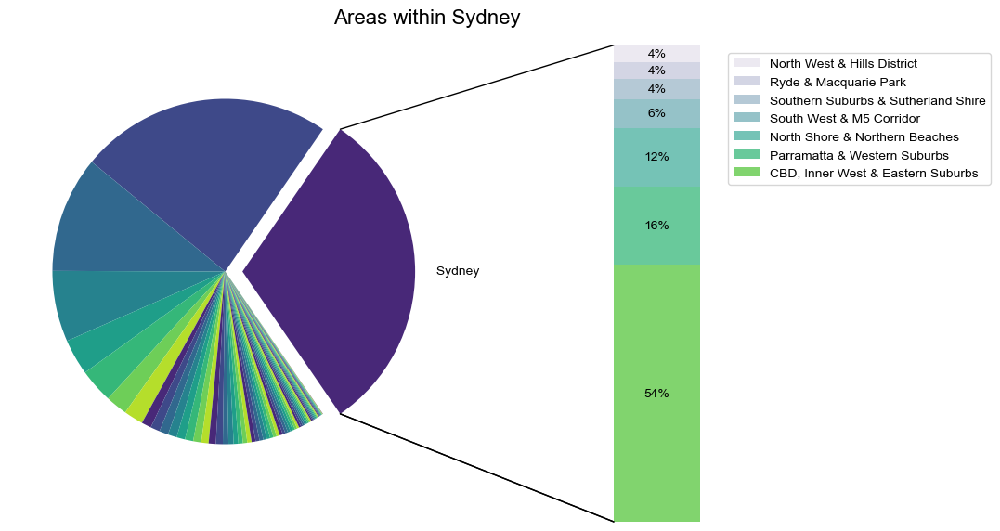

In [12]:
plot_bar_of_pie(df, 'Location', 'Sydney', 'Area', 'viridis')

### Salary statistics by Job Classification

(251.26169405815423, 175.00107020547946, 151.7215859030837, 124.07188415790381, 121.25956319462394, 117.19351836182095, 115.68868908001042, 114.8436053515947, 107.22083043377407, 101.48811198649409, 99.49821215733016, 87.0909090909091, 87.05025706940874, 85.71917808219177, 85.4325707059094, 84.17815674891146, 82.94835933297472, 79.37078428779262, 77.8248875562219, 72.139951179821, 70.39177215189873, 57.52901468498342, 57.329948141745895, 57.23879781420765, 56.06333739342266, 52.40781212982706, 47.920065511411664, 47.64953020134228, 44.09625562318074, 39.36149025069638)


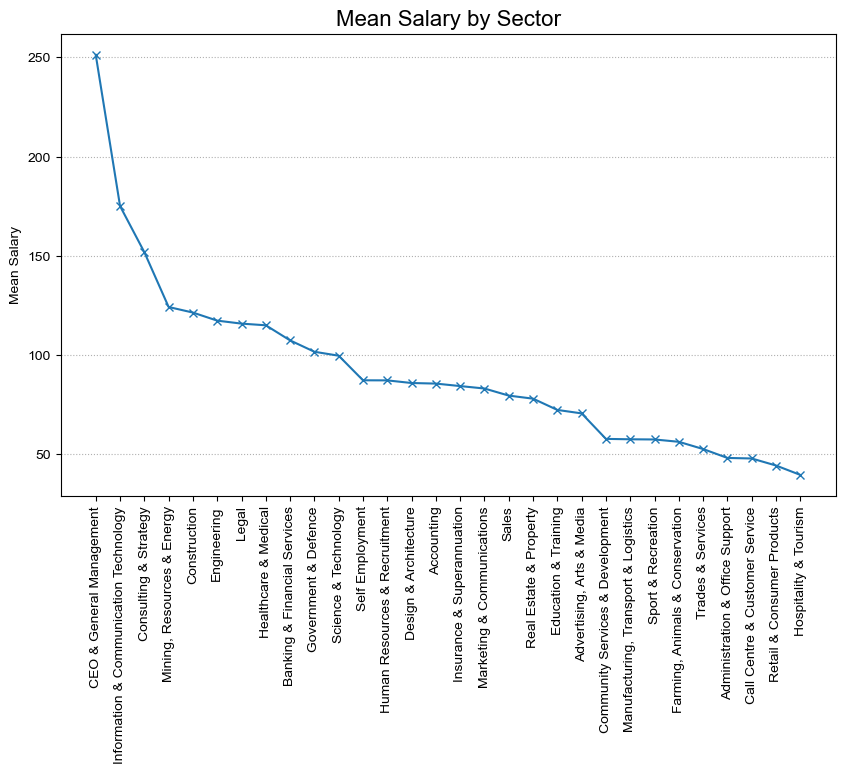

In [13]:
# Statistical Data for Salary by Classification
# Create a new column called 'Salary' which is the average of the lowest and highest salary
df['Salary'] = (df['LowestSalary'] + df['HighestSalary']) / 2

# Create empty lists to store the statistical values
classifications = []
mean_salaries = []

# Find mean salary for each classification
for classification in df['Classification'].unique():
    if type(classification) != str:
        continue
    # Filter the dataframe for the current classification
    subset = df[df['Classification'] == classification]
    
    # Calculate mean salary
    salary_mean = subset['Salary'].mean()
    
    # Store the classification and mean salary
    classifications.append(classification)
    mean_salaries.append(salary_mean)

# Sort the classifications and mean salaries in descending order of mean salary
classifications_sorted, mean_salaries_sorted = zip(*sorted(zip(classifications, mean_salaries), key=lambda x: x[1], reverse=True))

# Plot the graph
plt.figure(figsize=(10, 6))
plt.plot(classifications_sorted, mean_salaries_sorted, marker='x', label='Mean Salary')
print(mean_salaries_sorted)
plt.ylabel('Mean Salary')
plt.title('Mean Salary by Sector', fontsize=16)
plt.grid(axis='y', linestyle='dotted')

plt.xticks(rotation=90)
plt.show()


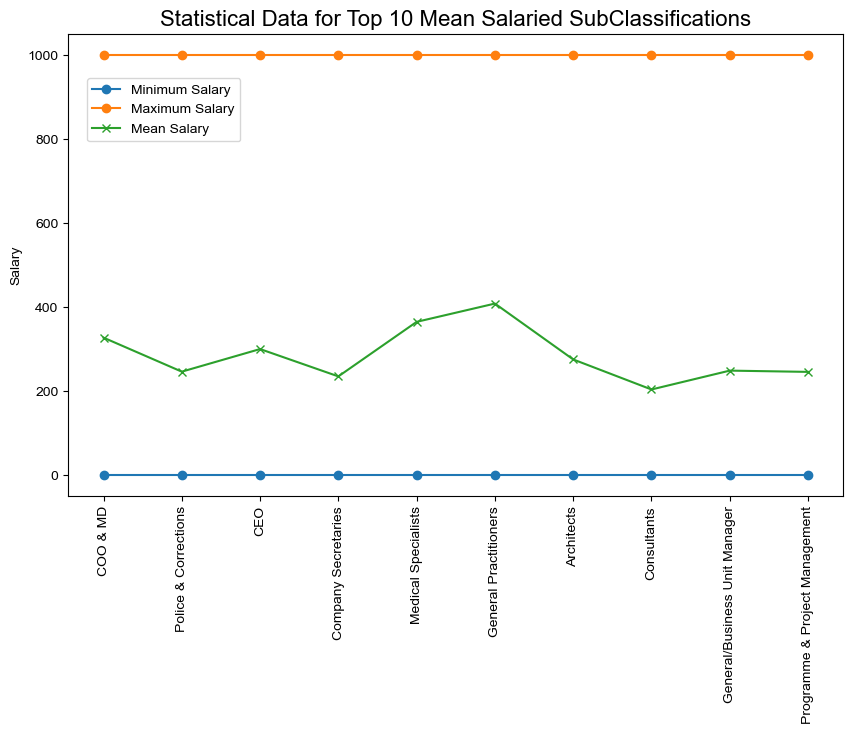

In [14]:
# Statistical Data for Top Salaries by SubClassification
# Calculate the number of entries for each subclassification
subclass_entry_counts = df['SubClassification'].value_counts()

# Filter the subclassifications with at least 10 entries
valid_subclassifications = subclass_entry_counts[subclass_entry_counts >= 10].index

# Calculate the mean salary for each valid subclassification
subclass_mean_salaries = df[df['SubClassification'].isin(valid_subclassifications)].groupby('SubClassification')['Salary'].mean()

# Sort the mean salaries in descending order and select the top 10
top_10_subclassifications = subclass_mean_salaries.nlargest(10).sort_values(ascending=False)

# # Filter the dataframe to include only the top 10 subclassifications
subset_df = df[df['SubClassification'].isin(top_10_subclassifications.index)]

# Create empty lists to store the statistical values
classification = []
min_salaries = []
max_salaries = []
mean_salaries = []

# Iterate over each subclassification
for subclassification in subset_df['SubClassification'].unique():
    # Filter the dataframe for the current subclassification
    subset = subset_df[subset_df['SubClassification'] == subclassification]
    # print("Number of Entries:", len(subset))

    # Calculate statistical data for the salary column
    salary_stats = subset['Salary'].describe()
    lowest_salary_stats = subset['LowestSalary'].describe()
    highest_salary_stats = subset['HighestSalary'].describe()
    
    # Extract the statistical values
    salary_range = [lowest_salary_stats['min'], highest_salary_stats['max']]
    salary_mean = salary_stats['mean']
    
    # Store the statistical values in the lists
    classification.append(subclassification)
    min_salaries.append(salary_range[0])
    max_salaries.append(salary_range[1])
    mean_salaries.append(salary_mean)

# Reverse the order of the lists
classification = classification[::-1]
min_salaries = min_salaries[::-1]
max_salaries = max_salaries[::-1]
mean_salaries = mean_salaries[::-1]

# Plot the graph
plt.figure(figsize=(10, 6))
plt.plot(classification, min_salaries, marker='o', label='Minimum Salary')
plt.plot(classification, max_salaries, marker='o', label='Maximum Salary')
plt.plot(classification, mean_salaries, marker='x', label='Mean Salary')
plt.ylabel('Salary')
plt.title('Statistical Data for Top 10 Mean Salaried SubClassifications', fontsize=16)
plt.legend()
#shift the legend down a bit
plt.legend(bbox_to_anchor=(0.015, 0.92), loc='upper left', frameon=True)
plt.xticks(rotation=90)
plt.show()

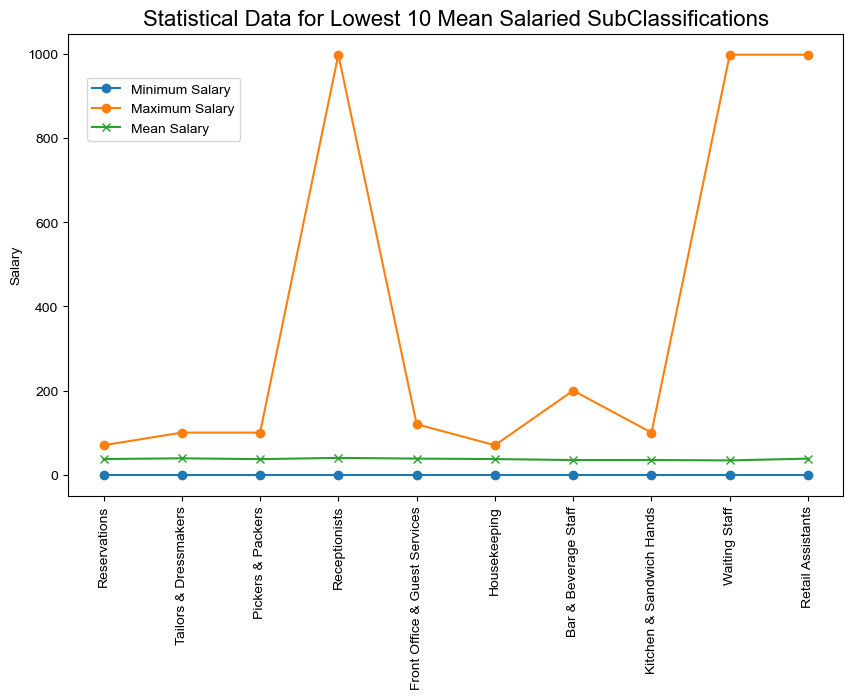

In [15]:
# Statistical Data for Lowest Salaries by SubClassification
# Calculate the number of entries for each subclassification
subclass_entry_counts = df['SubClassification'].value_counts()

# Filter the subclassifications with at least 10 entries
valid_subclassifications = subclass_entry_counts[subclass_entry_counts >= 10].index

# Calculate the mean salary for each valid subclassification
subclass_mean_salaries = df[df['SubClassification'].isin(valid_subclassifications)].groupby('SubClassification')['Salary'].mean()

# Sort the mean salaries in descending order and select the top 10
top_10_subclassifications = subclass_mean_salaries.nsmallest(10).sort_values(ascending=False)

# # Filter the dataframe to include only the top 10 subclassifications
subset_df = df[df['SubClassification'].isin(top_10_subclassifications.index)]

# Create empty lists to store the statistical values
classification = []
min_salaries = []
max_salaries = []
mean_salaries = []

# Iterate over each subclassification
for subclassification in subset_df['SubClassification'].unique():
    # Filter the dataframe for the current subclassification
    subset = subset_df[subset_df['SubClassification'] == subclassification]
    # print("Number of Entries:", len(subset))

    # Calculate statistical data for the salary column
    salary_stats = subset['Salary'].describe()
    lowest_salary_stats = subset['LowestSalary'].describe()
    highest_salary_stats = subset['HighestSalary'].describe()
    
    # Extract the statistical values
    salary_range = [lowest_salary_stats['min'], highest_salary_stats['max']]
    salary_mean = salary_stats['mean']
    
    # Store the statistical values in the lists
    classification.append(subclassification)
    min_salaries.append(salary_range[0])
    max_salaries.append(salary_range[1])
    mean_salaries.append(salary_mean)

# Reverse the order of the lists
classification = classification[::-1]
min_salaries = min_salaries[::-1]
max_salaries = max_salaries[::-1]
mean_salaries = mean_salaries[::-1]

# Plot the graph
plt.figure(figsize=(10, 6))
plt.plot(classification, min_salaries, marker='o', label='Minimum Salary')
plt.plot(classification, max_salaries, marker='o', label='Maximum Salary')
plt.plot(classification, mean_salaries, marker='x', label='Mean Salary')
plt.ylabel('Salary')
plt.title('Statistical Data for Lowest 10 Mean Salaried SubClassifications', fontsize=16)
plt.legend()
#shift the legend down a bit
plt.legend(bbox_to_anchor=(0.015, 0.92), loc='upper left', frameon=True)
plt.xticks(rotation=90)
plt.show()


In [16]:
# find the percentage of CEO & General Management jobs in with a LowestSalary of 200
print("Percentage of CEO & General Management jobs with a LowestSalary of 200:", df[(df['Classification'] == 'CEO & General Management') & (df['LowestSalary'] == 200)].shape[0] / df[df['Classification'] == 'CEO & General Management'].shape[0])


Percentage of CEO & General Management jobs with a LowestSalary of 200: 0.2831858407079646


# Market by Locations

### Jobs by Location

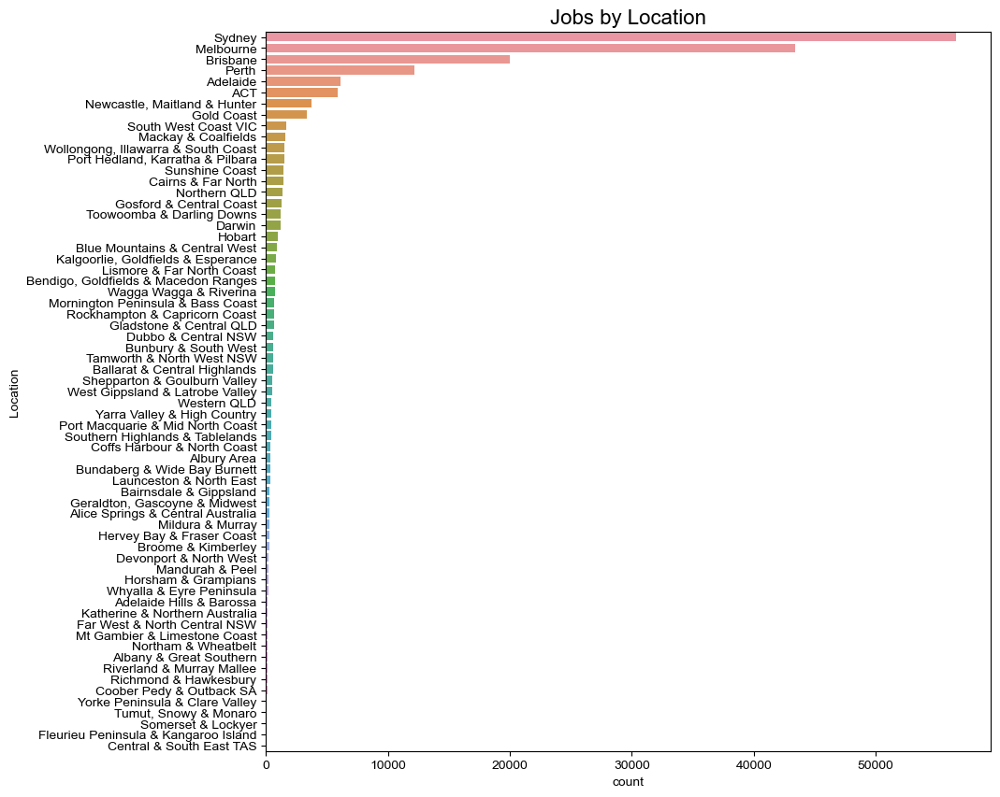

In [17]:
#plot and display a seaborn chart for location column
plt.figure(figsize=(10,10))
sns.countplot(y='Location', data=df, order=df['Location'].value_counts().index)
plt.title("Jobs by Location", fontsize=16)
plt.show()
sns.set(font_scale=0.8)


### Job Classifications by Location

In [18]:
#print number of job postings in sydney
print("Number of job postings in Sydney:", df[df['Location'] == 'Sydney'].shape[0])
df[df['Location'] == 'Sydney'].value_counts()


Number of job postings in Sydney: 56601


Unnamed: 0  Date                       Location  Area                               Classification                          SubClassification                   Requirement                                                                                                                                             FullDescription                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 

In [19]:
#calculate percentage of job postings for each location in descending order
location_percentages = df['Location'].value_counts(normalize=True) * 100
location_percentages = location_percentages.sort_values(ascending=False)
#calculate cumulative sum of percentages
location_cumulative_percentages = location_percentages.cumsum()
#print percentage and cumulative percetage
print(location_percentages[:10])

Sydney                          30.841366
Melbourne                       23.629191
Brisbane                        10.895092
Perth                            6.640585
Adelaide                         3.354348
ACT                              3.203413
Newcastle, Maitland & Hunter     2.037347
Gold Coast                       1.818846
South West Coast VIC             0.914872
Mackay & Coalfields              0.877819
Name: Location, dtype: float64


<Figure size 800x2000 with 0 Axes>

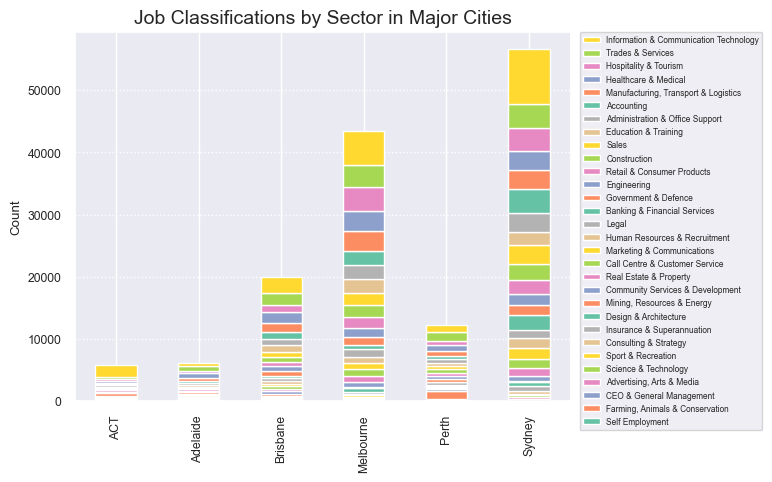

In [20]:
# Get the top 7 most populous locations
top_6_locations = df['Location'].value_counts().nlargest(6).index

# Filter the DataFrame for the top 7 locations
df_top_locations = df[df['Location'].isin(top_6_locations)]

# Group the data by location and classification and sum the counts
grouped_data = df_top_locations.groupby(['Location', 'Classification']).size().reset_index(name='Count').groupby(['Location', 'Classification']).sum().reset_index()

# Pivot the data to create a table with locations as rows, classifications as columns, and count as values
pivoted_data = grouped_data.pivot(index='Location', columns='Classification', values='Count').fillna(0)

# Sort the columns based on their sum (largest to smallest)
pivoted_data = pivoted_data[pivoted_data.sum().sort_values(ascending=True).index]

# Define a custom color palette with distinct colors for each classification
n_colors = len(pivoted_data.columns)
color_palette = sns.color_palette('Set2', n_colors=n_colors)

# Plot the stacked bar plot with the custom color palette
plt.figure(figsize=(8, 20))
pivoted_data.plot(kind='bar', stacked=True, color=color_palette)
plt.title('Job Classifications by Sector in Major Cities', fontsize=14)
plt.xlabel('')
plt.ylabel('Count')
plt.grid(axis='y', linestyle='dotted')
# plt.legend(bbox_to_anchor=(0, 1.5), loc='upper left', frameon=True)

# Reverse the order of the legend labels
handles, labels = plt.gca().get_legend_handles_labels()
plt.gca().legend(reversed(handles), reversed(labels), bbox_to_anchor=(1.01, 1.01), loc='upper left', frameon=True, prop={'size': 6})

plt.show()


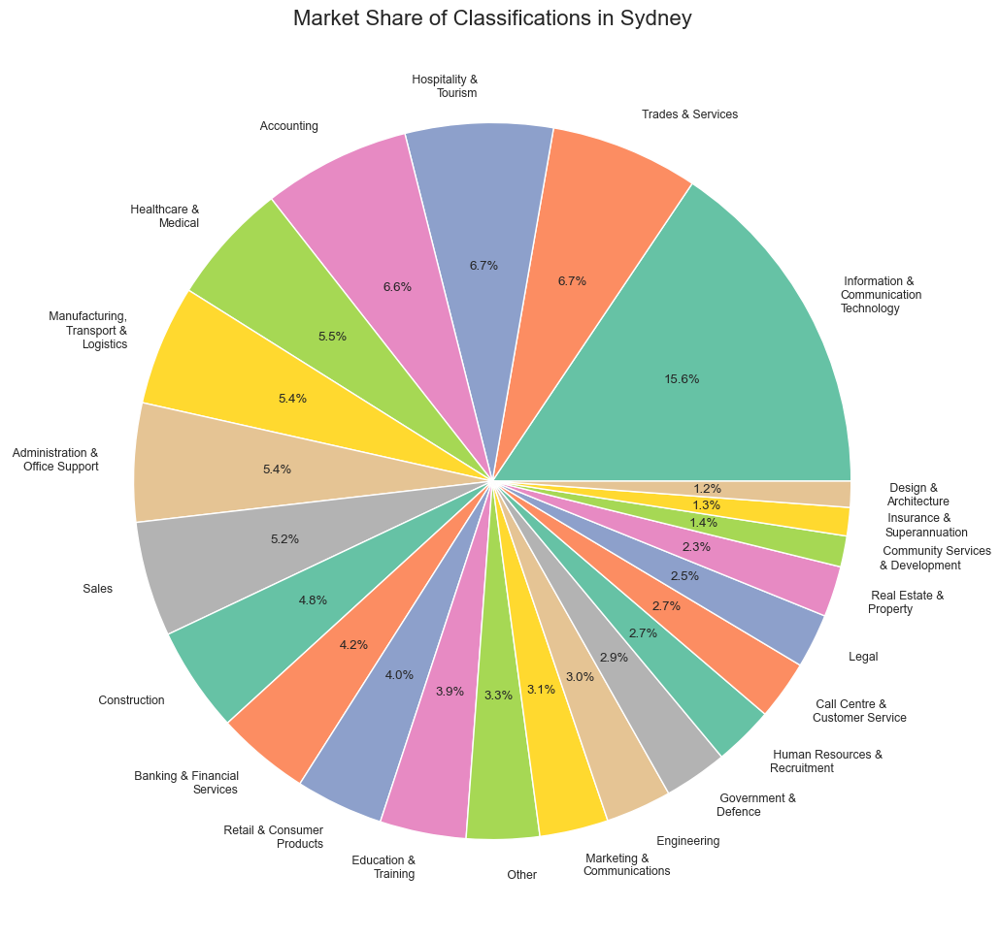

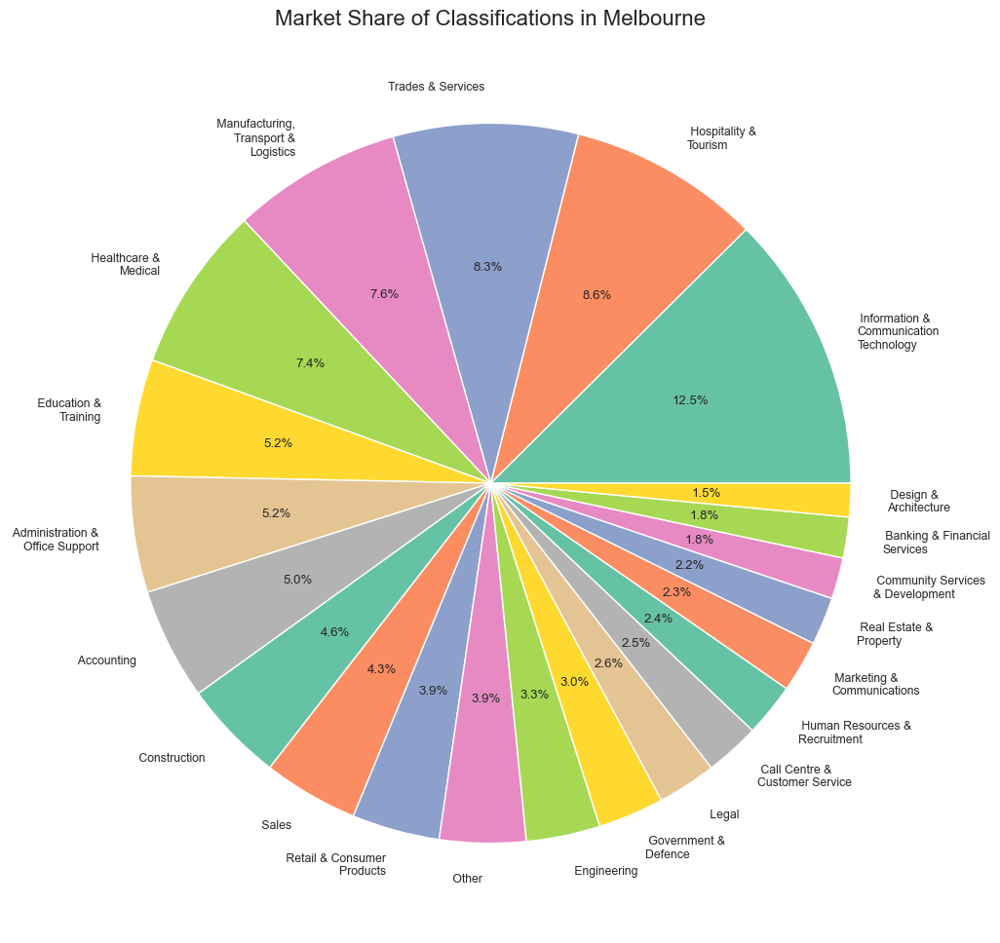

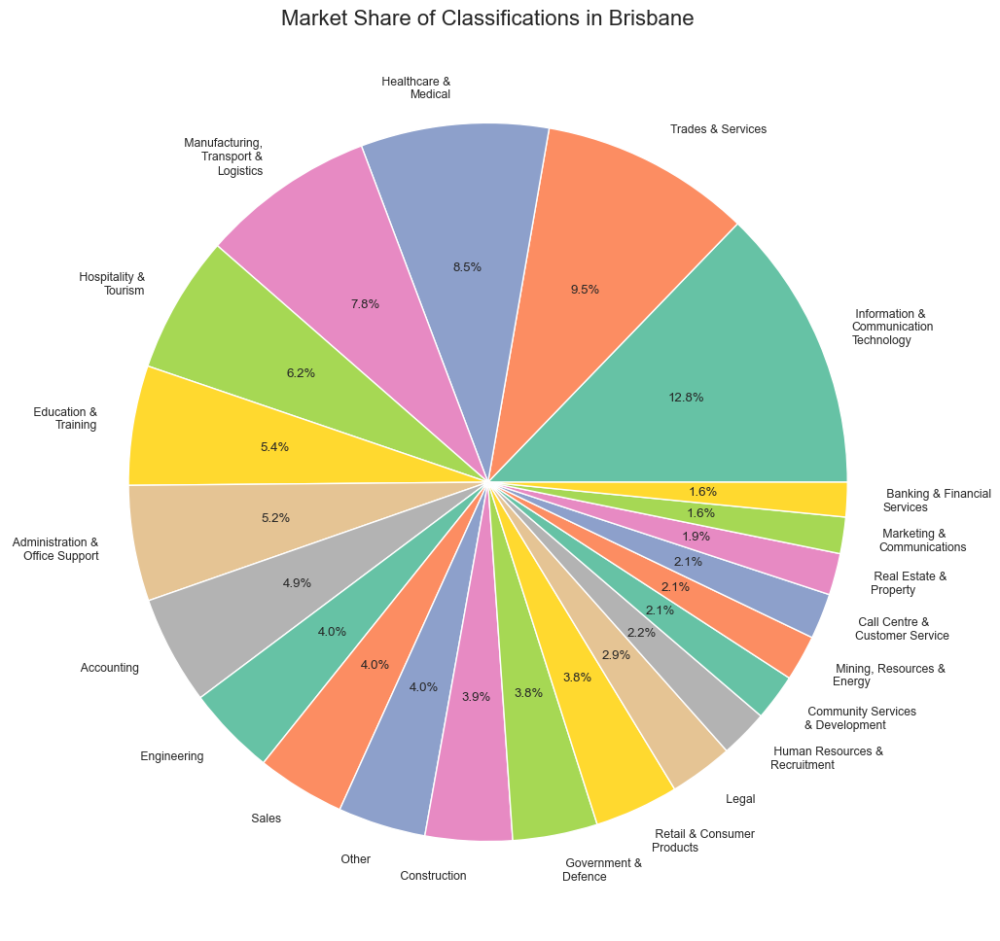

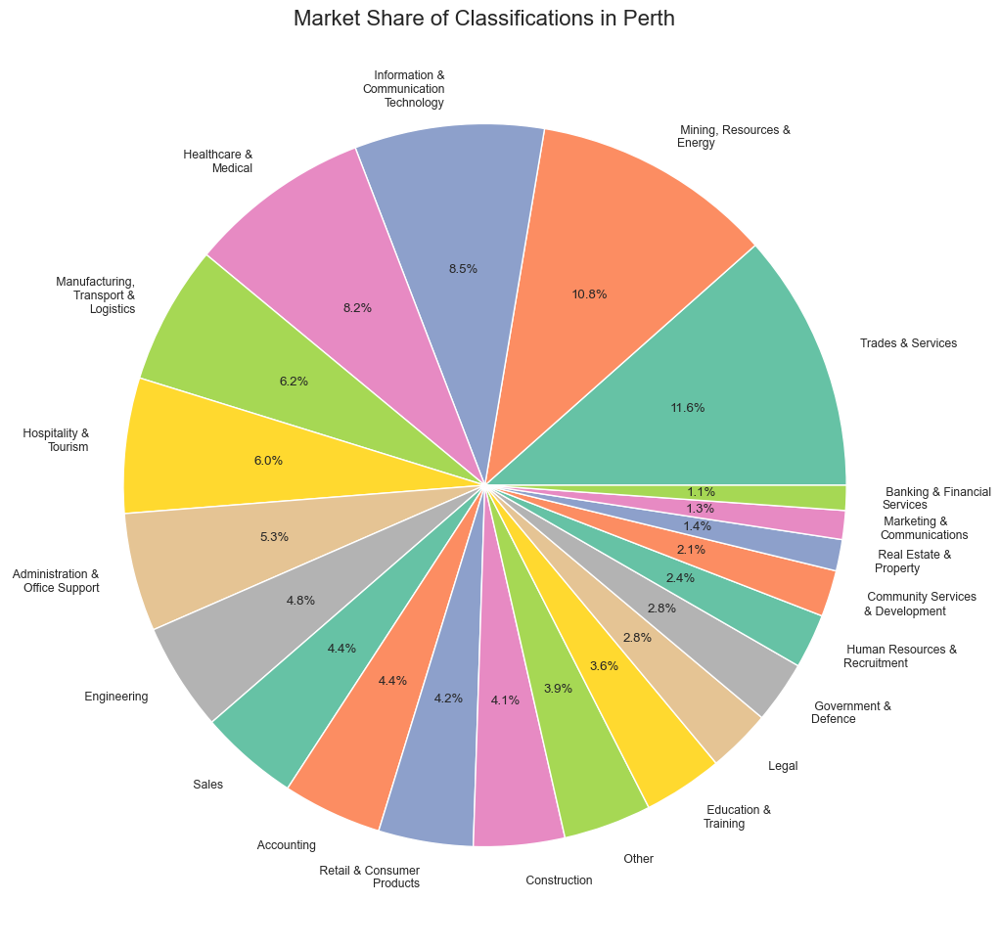

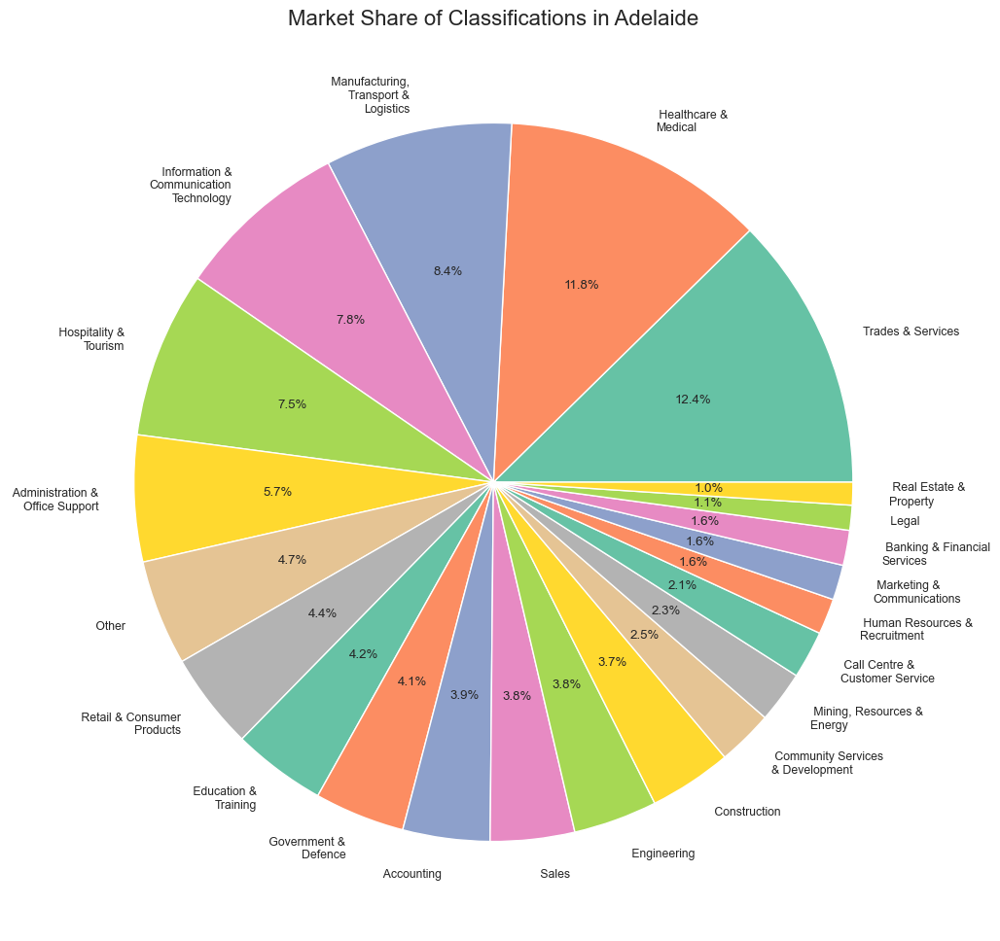

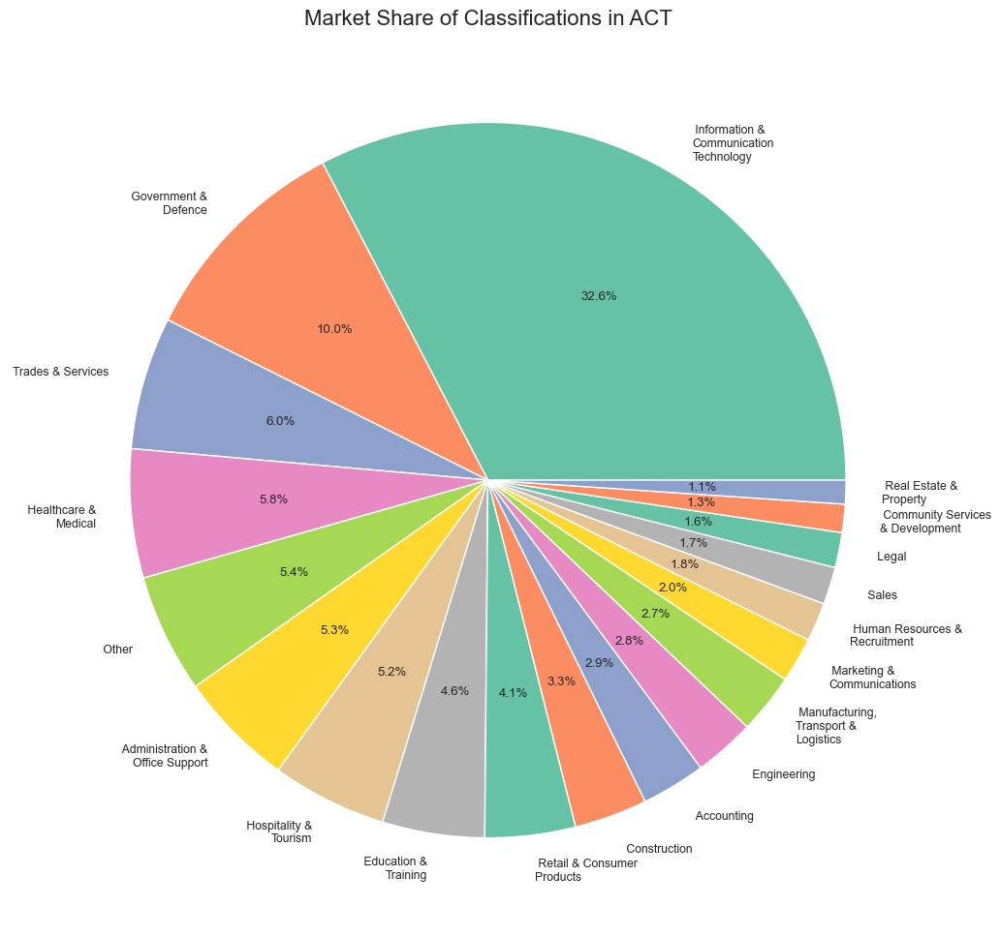

In [21]:
def split_label(label, max_length):
    words = label.split(' ')
    lines = []
    current_line = ''
    for word in words:
        if len(current_line + ' ' + word) <= max_length:
            current_line += ' ' + word
        else:
            lines.append(current_line)
            current_line = word
    lines.append(current_line)  # Don't forget the last line
    return '\n'.join(lines)

def plot_classification_pie_charts(df):
    top_locations = df['Location'].value_counts().nlargest(6).index
    colors = sns.color_palette("Set2")

    for location in top_locations:
        location_df = df[df['Location'] == location]
        classification_counts = location_df['Classification'].value_counts(normalize=True) * 100
        classification_df = classification_counts.reset_index()
        classification_df.columns = ['Classification', 'Percentage']
        classification_df['Classification'] = classification_df.apply(lambda row: row['Classification'] if row['Percentage'] > 1 else 'Other', axis=1)
        classification_df = classification_df.groupby('Classification').sum()
        classification_df = classification_df.sort_values('Percentage', ascending=False)

        plt.figure(figsize=(15, 12))

        # Splitting the labels using split_label function
        split_labels = [split_label(label, 20) for label in classification_df.index]

        plt.pie(classification_df['Percentage'], labels=split_labels, autopct='%1.1f%%', colors=colors)
        plt.title(f'Market Share of Classifications in {location}', fontsize=16)
        plt.show()

# Call the function
plot_classification_pie_charts(df)



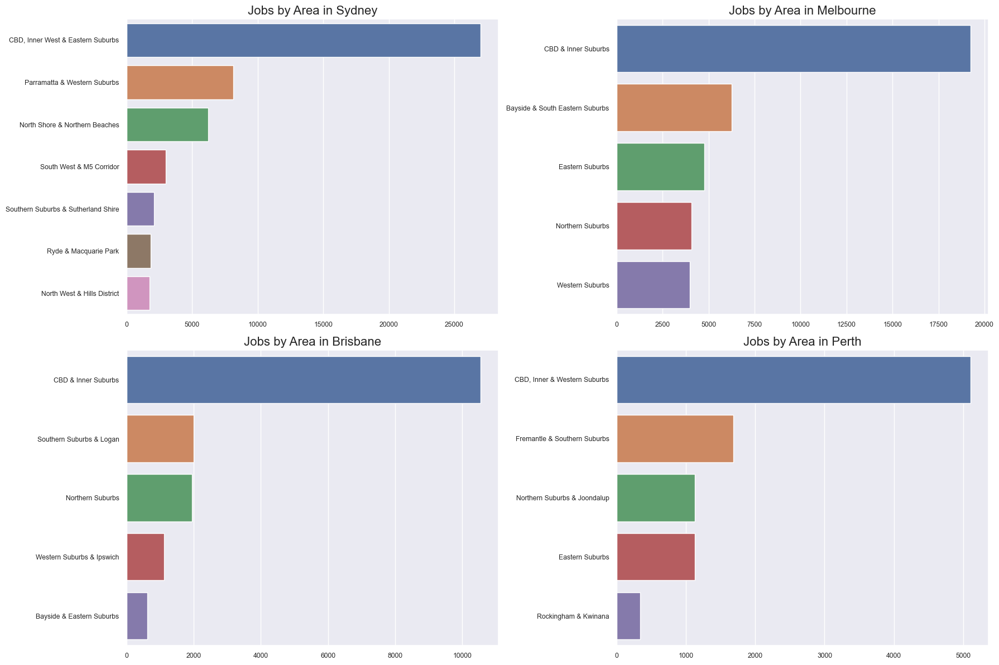

In [22]:
# Create a list of the 4 locations which have Area data
top_4_locations = df['Location'].value_counts().nlargest(4).index
locations = top_4_locations.to_list()
# Create a figure and axes for the subplots
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Iterate over the locations and plot the countplot in each subplot
for i, location in enumerate(locations):
    # Calculate the subplot position
    row = i // 2
    col = i % 2
    
    # Select the data for the specific location
    data = df[df['Location'] == location]
    
    # Plot the countplot in the corresponding subplot
    sns.countplot(y='Area', data=data, order=data['Area'].value_counts().index, ax=axes[row, col])
    axes[row, col].set_title("Jobs by Area in {}".format(location), fontsize=16)
    axes[row, col].set_ylabel('')
    axes[row, col].set_xlabel('')

# Adjust the spacing between subplots
fig.tight_layout()

# Display the figure
plt.show()

### Salaries by Location

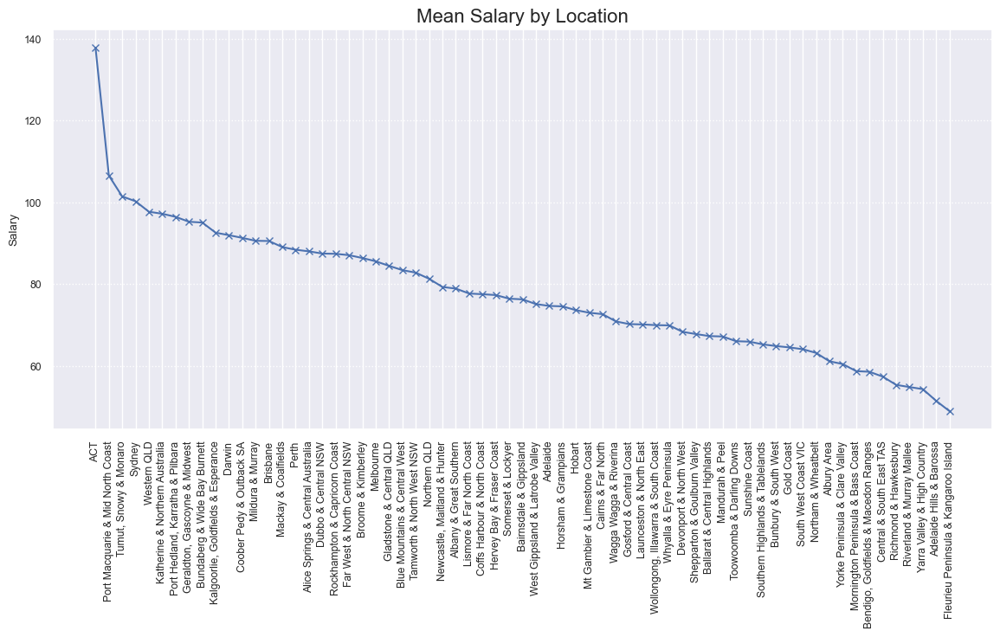

In [23]:
# Calculate the mean salary for each location
location_mean_salaries = df.groupby('Location')['Salary'].mean()

# Sort the locations based on their mean salary in descending order
sorted_locations = location_mean_salaries.sort_values(ascending=False)

# Create empty lists to store the statistical values
locations = []
min_salaries = []
max_salaries = []
mean_salaries = []

# Iterate over each location in sorted order
for location in sorted_locations.index:
    # Filter the dataframe for the current location
    subset = df[df['Location'] == location]
    
    # Calculate statistical data for the salary column
    salary_stats = subset['Salary'].describe()
    lowest_salary_stats = subset['LowestSalary'].describe()
    highest_salary_stats = subset['HighestSalary'].describe()
    
    # Extract the statistical values
    salary_range = [lowest_salary_stats['min'], highest_salary_stats['max']]
    salary_mean = salary_stats['mean']
    
    # Store the statistical values in the lists
    locations.append(location)
    min_salaries.append(salary_range[0])
    max_salaries.append(salary_range[1])
    mean_salaries.append(salary_mean)
    
# Plot the graph
plt.figure(figsize=(14, 6))
# plt.plot(locations, min_salaries, marker='o', label='Minimum Salary')
# plt.plot(locations, max_salaries, marker='o', label='Maximum Salary')
plt.plot(locations, mean_salaries, marker='x', label='Mean Salary')
plt.ylabel('Salary')
plt.title('Mean Salary by Location', fontsize=16)
plt.grid(axis='y', linestyle='dotted')
plt.xticks(rotation=90)
plt.show()


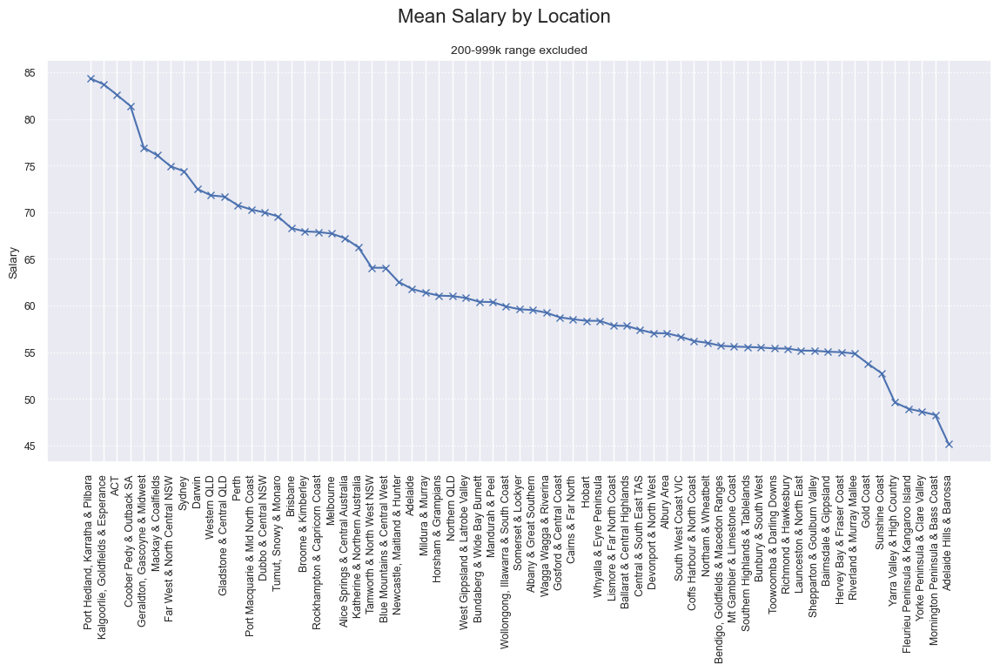

In [24]:
# Create new data frame which removes all jobs with a highest salary of 999
df_filtered = df[df['HighestSalary'] != 999]

# Calculate the mean salary for each location
location_mean_salaries = df_filtered.groupby('Location')['Salary'].mean()

# Sort the locations based on their mean salary in descending order
sorted_locations = location_mean_salaries.sort_values(ascending=False)

# Create empty lists to store the statistical values
locations = []
min_salaries = []
max_salaries = []
mean_salaries = []

# Iterate over each location in sorted order
for location in sorted_locations.index:
    # Filter the dataframe for the current location
    subset = df_filtered[df_filtered['Location'] == location]
    
    # Calculate statistical data for the salary column
    salary_stats = subset['Salary'].describe()
    lowest_salary_stats = subset['LowestSalary'].describe()
    highest_salary_stats = subset['HighestSalary'].describe()
    
    # Extract the statistical values
    salary_range = [lowest_salary_stats['min'], highest_salary_stats['max']]
    salary_mean = salary_stats['mean']
    
    # Store the statistical values in the lists
    locations.append(location)
    min_salaries.append(salary_range[0])
    max_salaries.append(salary_range[1])
    mean_salaries.append(salary_mean)
    
# Plot the graph
plt.figure(figsize=(14, 6))
# plt.plot(locations, min_salaries, marker='o', label='Minimum Salary')
# plt.plot(locations, max_salaries, marker='o', label='Maximum Salary')
plt.plot(locations, mean_salaries, marker='x', label='Mean Salary')
plt.ylabel('Salary')
plt.suptitle('Mean Salary by Location', fontsize=16)
plt.title('200-999k range excluded', fontsize=10)
plt.grid(axis='y', linestyle='dotted')
plt.xticks(rotation=90)
plt.show()

### The Top 10 Highest Mean Salaries by Location

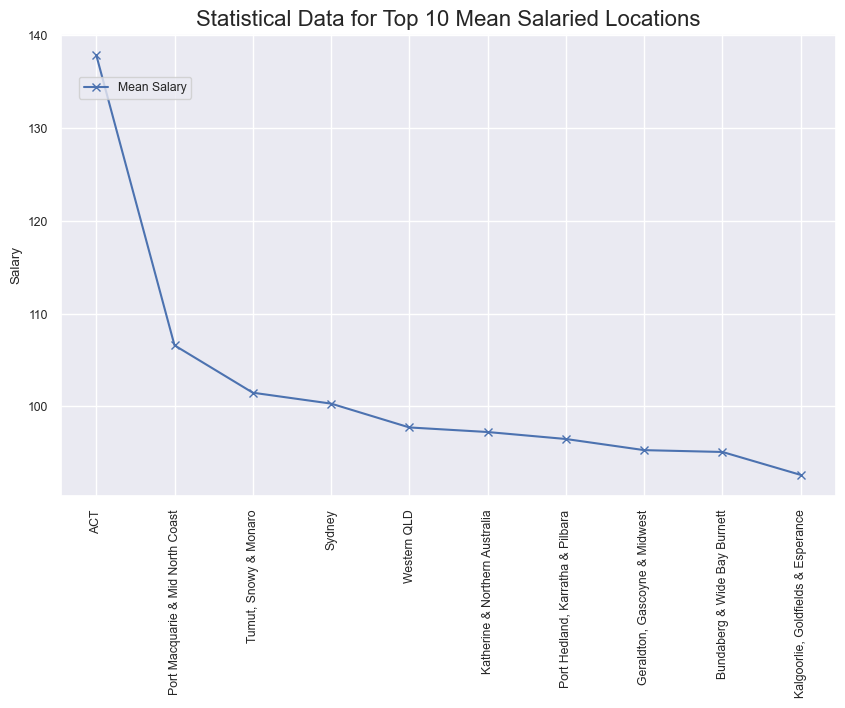

In [25]:
# Calculate the mean salary for each location
location_mean_salaries = df.groupby('Location')['Salary'].mean()

# Calculate the number of entries for each location
location_entry_counts = df['Location'].value_counts()

# Filter the locations with at least 10 entries
valid_locations = location_entry_counts[location_entry_counts >= 10].index

# Calculate the mean salary for each valid location
location_mean_salaries = df[df['Location'].isin(valid_locations)].groupby('Location')['Salary'].mean()

# Sort the mean salaries in descending order and select the top 10
top_10_locations = location_mean_salaries.nlargest(10).sort_values(ascending=False)

# Filter the dataframe to include only the top 10 locations
subset_df = df[df['Location'].isin(top_10_locations.index)]

# Create empty lists to store the statistical values
locations = []
mean_salaries = []

# Iterate over each location
for location in top_10_locations.index:
    # Filter the dataframe for the current location
    subset = subset_df[subset_df['Location'] == location]

    # Calculate statistical data for the salary column
    salary_stats = subset['Salary'].describe()

    # Extract the statistical values
    salary_mean = salary_stats['mean']

    # Store the statistical values in the lists
    locations.append(location)
    mean_salaries.append(salary_mean)

# Plot the graph
plt.figure(figsize=(10, 6))
plt.plot(locations, mean_salaries, marker='x', label='Mean Salary')
plt.ylabel('Salary')
plt.title('Statistical Data for Top 10 Mean Salaried Locations', fontsize=16)
# Shift the legend down a bit
plt.legend(bbox_to_anchor=(0.015, 0.92), loc='upper left', frameon=True)
plt.xticks(rotation=90)
plt.show()


### The Top 10 Lowest Mean Salaries by Location

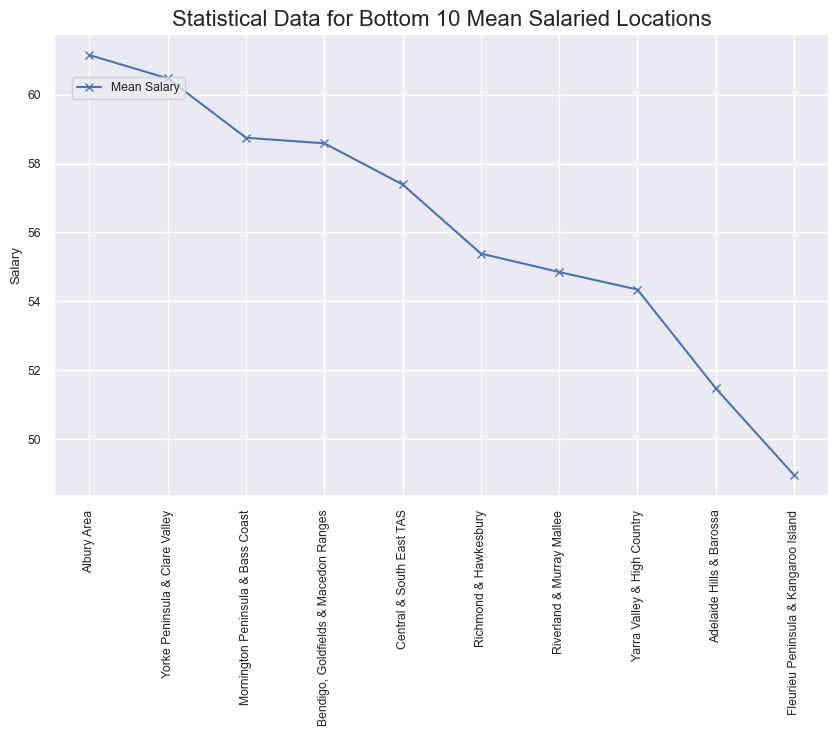

In [26]:
# Calculate the mean salary for each location
location_mean_salaries = df.groupby('Location')['Salary'].mean()

# Calculate the number of entries for each location
location_entry_counts = df['Location'].value_counts()

# Filter the locations with at least 10 entries
valid_locations = location_entry_counts[location_entry_counts >= 10].index

# Calculate the mean salary for each valid location
location_mean_salaries = df[df['Location'].isin(valid_locations)].groupby('Location')['Salary'].mean()

# Sort the mean salaries in descending order and select the top 10
top_10_locations = location_mean_salaries.nsmallest(10).sort_values(ascending=False)

# Filter the dataframe to include only the top 10 locations
subset_df = df[df['Location'].isin(top_10_locations.index)]

# Create empty lists to store the statistical values
locations = []
mean_salaries = []

# Iterate over each location
for location in top_10_locations.index:
    # Filter the dataframe for the current location
    subset = subset_df[subset_df['Location'] == location]

    # Calculate statistical data for the salary column
    salary_stats = subset['Salary'].describe()

    # Extract the statistical values
    salary_mean = salary_stats['mean']

    # Store the statistical values in the lists
    locations.append(location)
    mean_salaries.append(salary_mean)

# Plot the graph
plt.figure(figsize=(10, 6))
plt.plot(locations, mean_salaries, marker='x', label='Mean Salary')
plt.ylabel('Salary')
plt.title('Statistical Data for Bottom 10 Mean Salaried Locations', fontsize=16)
plt.legend()
# Shift the legend down a bit
plt.legend(bbox_to_anchor=(0.015, 0.92), loc='upper left', frameon=True)
plt.xticks(rotation=90)
plt.show()

### Most Common Salary Range by Location

In [27]:
def normalize_range(range_str):
    # Split the range string by the hyphen
    low, high = range_str.split('-')
    
    # Convert the low and high values to integers
    low = int(float(low))
    high = int(float(high))
    
    # Normalize the range values
    low_normalized = str(low) + 'K'
    high_normalized = str(high) + 'K'
    
    # Return the normalized range string
    return low_normalized + '-' + high_normalized

def extract_min_salary(range_str):
    low, _ = range_str.split('-')
    return int(low)

# Find the most common salary range in each location
# make new column of LowestSalary and HighestSalary pair
df['SalaryRange'] = df['LowestSalary'].astype(str) + '-' + df['HighestSalary'].astype(str)
# Find the most common salary range in each location
most_common_salary_ranges = df.groupby('Location')['SalaryRange'].agg(lambda x: x.value_counts().index[0])
temp_series = most_common_salary_ranges.apply(extract_min_salary)
most_common_salary_ranges = most_common_salary_ranges[temp_series.sort_values(ascending=False).index]


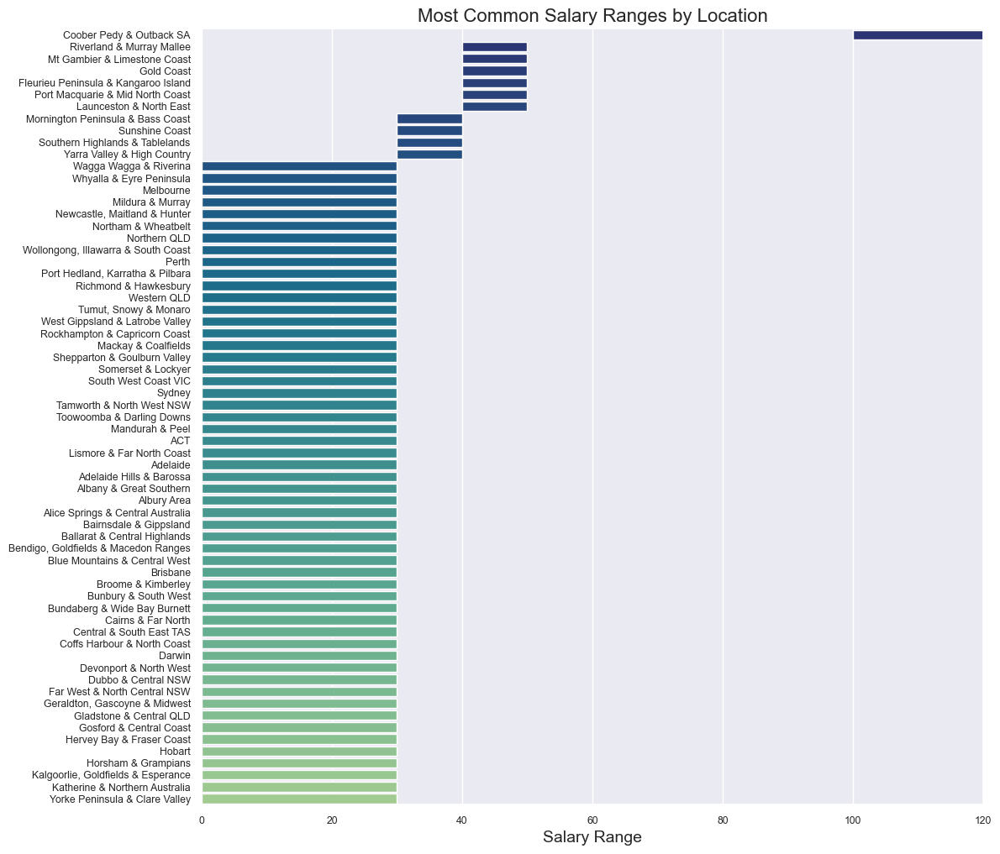

In [28]:
# Plot and visualise most common salary ranges by location
# Create a figure and axes
fig, ax = plt.subplots(figsize=(12, 12))

# Extract the location names and salary ranges
locations = most_common_salary_ranges.index
salary_ranges = most_common_salary_ranges.values
palette = sns.color_palette("crest", len(locations))

# Invert locations and salary_ranges
locations = locations[::-1]
salary_ranges = salary_ranges[::-1]

# Plot the horizontal bar chart
for i, (location, salary_range) in enumerate(zip(locations, salary_ranges)):
    low, high = map(float, salary_range.split('-'))
    ax.barh(location, high - low, left=low, color=palette[i])


# Set the y-axis labels to location names
ax.set_yticks(range(len(locations)))
ax.set_yticklabels(locations)

# Set the axis limits
ax.set_ylim(-0.5, len(locations) - 0.5)
ax.set_xlim(0, 120)

# Set the x-axis label
ax.set_xlabel('Salary Range', fontsize=14)
# Remove y-axis grid lines
ax.grid(axis='y', which='both', color='gray', linestyle='', linewidth=0)

# Set the title
ax.set_title('Most Common Salary Ranges by Location', fontsize=16)

# Show the plot
plt.show()


C:\Users\James\AppData\Local\Temp\ipykernel_17960\2207742226.py:44: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xtick_labels)


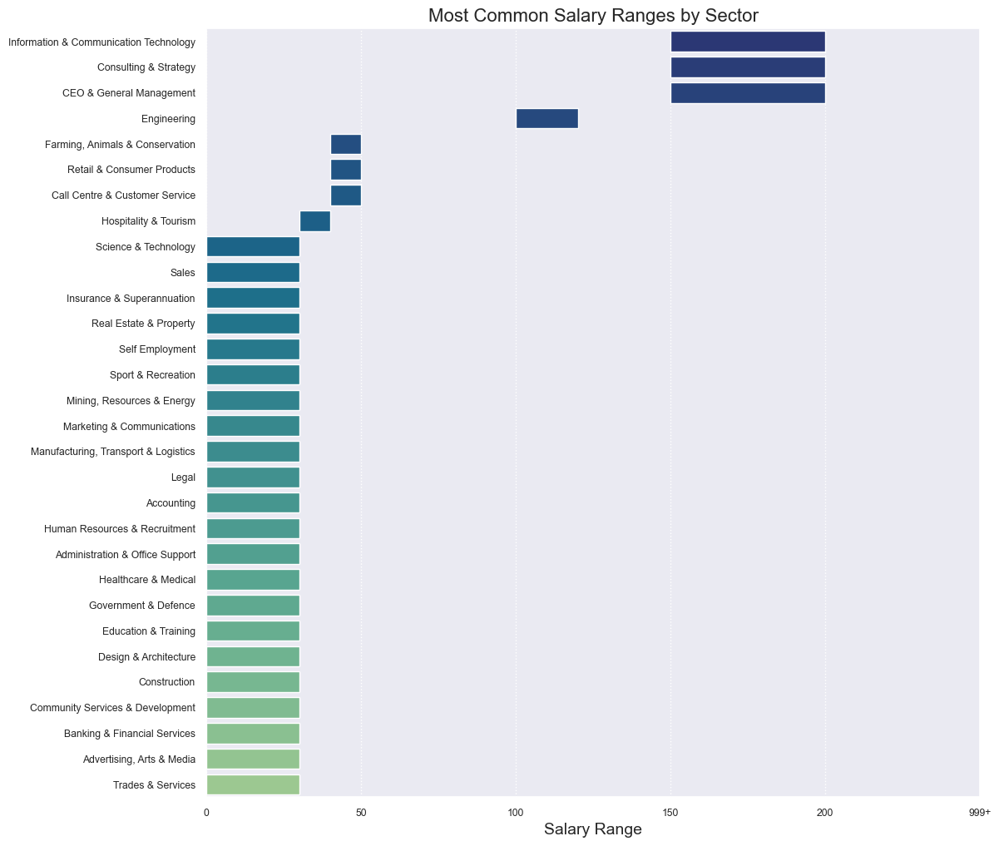

In [29]:
# Find the most common salary range in each location
most_common_salary_ranges = df.groupby('Classification')['SalaryRange'].agg(lambda x: x.value_counts().index[0])
temp_series = most_common_salary_ranges.apply(extract_min_salary)
most_common_salary_ranges = most_common_salary_ranges[temp_series.sort_values(ascending=False).index]
norm_most_common_salary_ranges = cp.deepcopy(most_common_salary_ranges)

# Plot and visualize most common salary ranges by classification
# Create a figure and axes
fig, ax = plt.subplots(figsize=(12, 12))

# Extract the classification names and salary ranges
classifications = most_common_salary_ranges.index
salary_ranges = most_common_salary_ranges.values
palette = sns.color_palette("crest", len(classifications))

# Invert classifications and salary_ranges
classifications = classifications[::-1]
salary_ranges = salary_ranges[::-1]

# Plot the horizontal bar chart
for i, (classification, salary_range) in enumerate(zip(classifications, salary_ranges)):
    low, high = map(float, salary_range.split('-'))
    ax.barh(classification, high - low, left=low, color=palette[i])

# Set the y-axis labels to classification names
ax.set_yticks(range(len(classifications)))
ax.set_yticklabels(classifications)

# Set the axis limits
ax.set_ylim(-0.5, len(classifications) - 0.5)
ax.set_xlim(0, 250)

# Set the x-axis label
ax.set_xlabel('Salary Range', fontsize=14)

# Remove y-axis grid lines
ax.grid(axis='y', which='both', color='gray', linestyle='', linewidth=0)

# Set the xtick labels
xtick_labels = list(ax.get_xticks())
#convert xtick_labels to int
xtick_labels = [int(x) for x in xtick_labels]
xtick_labels[-1] = '999+'  # Change the label for the last xtick to '999'
ax.set_xticklabels(xtick_labels)
# add dotted x axis grid lines
ax.grid(axis='x', linestyle='dotted')
# Set the title
ax.set_title('Most Common Salary Ranges by Sector', fontsize=16)

# Show the plot
plt.show()


C:\Users\James\AppData\Local\Temp\ipykernel_17960\3245560787.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xtick_labels)


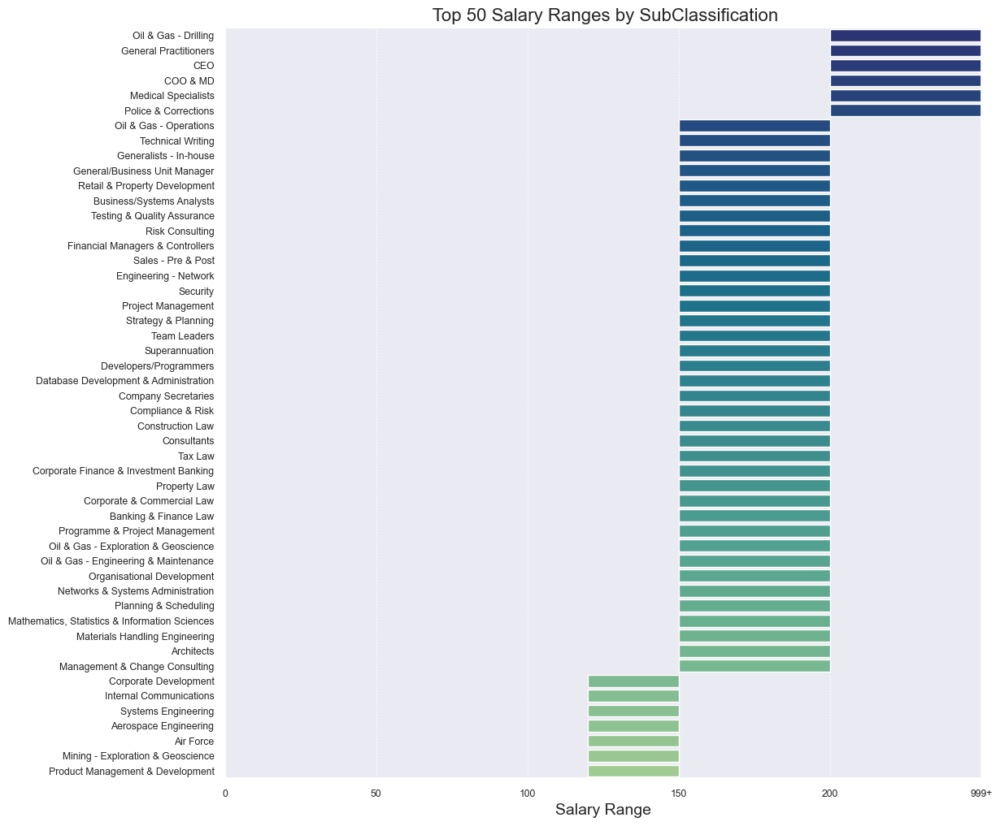

Counter({'Information & Communication Technology': 13, 'Legal': 6, 'Mining, Resources & Energy': 5, 'Engineering': 4, 'Consulting & Strategy': 3, 'CEO & General Management': 3, 'Marketing & Communications': 2, 'Government & Defence': 2, 'Banking & Financial Services': 2, 'Accounting': 2, 'Insurance & Superannuation': 2, 'Healthcare & Medical': 2, 'Science & Technology': 1, 'Construction': 1, 'Human Resources & Recruitment': 1, 'Real Estate & Property': 1})


In [30]:
# Find the most common salary range in each location
most_common_salary_ranges = df.groupby('SubClassification')['SalaryRange'].agg(lambda x: x.value_counts().index[0])
temp_series = most_common_salary_ranges.apply(extract_min_salary)
most_common_salary_ranges = most_common_salary_ranges[temp_series.sort_values(ascending=False).index]
most_common_salary_ranges = most_common_salary_ranges[:50]

# Plot and visualize most common salary ranges by classification
# Create a figure and axes
fig, ax = plt.subplots(figsize=(12, 12))

# Extract the classification names and salary ranges
subclassifications = most_common_salary_ranges.index
salary_ranges = most_common_salary_ranges.values
palette = sns.color_palette("crest", 50)


# Invert classifications and salary_ranges
subclassifications = subclassifications[::-1]
salary_ranges = salary_ranges[::-1]
#collect Classifications for subclassifications in list
classifications = []
for subclassification in subclassifications:
    classification = df[df['SubClassification'] == subclassification]['Classification'].iloc[0]
    classifications.append(classification)

# Plot the horizontal bar chart
for i, (subclassification, salary_range) in enumerate(zip(subclassifications, salary_ranges)):
    low, high = map(float, salary_range.split('-'))
    ax.barh(subclassification, high - low, left=low, color=palette[i])

# Set the y-axis labels to classification names
ax.set_yticks(range(len(subclassifications)))
ax.set_yticklabels(subclassifications)

# Set the axis limits
ax.set_ylim(-0.5, len(subclassifications) - 0.5)
ax.set_xlim(0, 250)

# Set the x-axis label
ax.set_xlabel('Salary Range', fontsize=14)

# Remove y-axis grid lines
ax.grid(axis='y', which='both', color='gray', linestyle='', linewidth=0)

# Set the xtick labels
xtick_labels = list(ax.get_xticks())
#convert xtick_labels to int
xtick_labels = [int(x) for x in xtick_labels]
xtick_labels[-1] = '999+'  # Change the label for the last xtick to '999'
ax.set_xticklabels(xtick_labels)
# add dotted x axis grid lines
ax.grid(axis='x', linestyle='dotted')
# Set the title
ax.set_title(' Top 50 Salary Ranges by SubClassification', fontsize=16)

# Show the plot
plt.show()
#print count of unique elements in classifications
classifications_count = Counter(classifications)
print(classifications_count)

### Trend

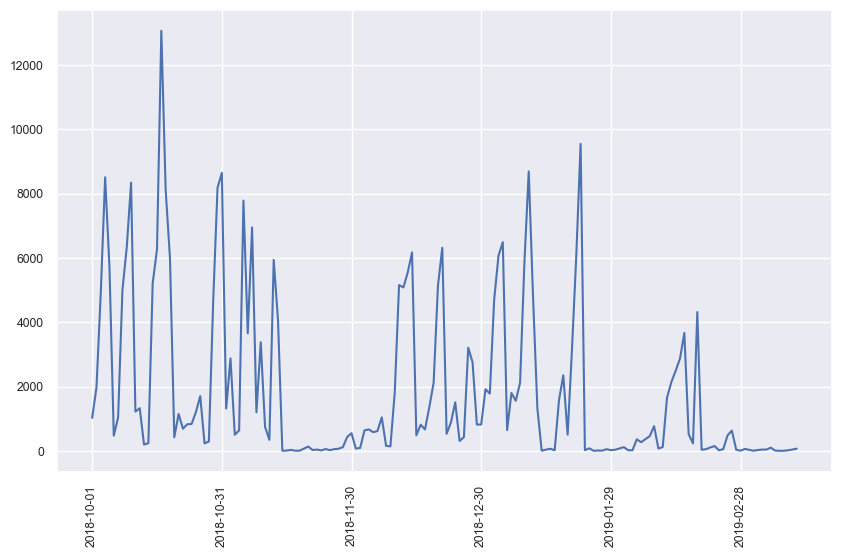

In [31]:
train = df['Date'].value_counts().sort_index()
test = df['Date'].value_counts().sort_index()

#print the date assigned with how many duplicates there are
plt.figure(figsize=(10, 6))
plt.plot(train)

#on show every 10th date
plt.tick_params(axis='x', labelrotation=90)
plt.xticks(train.index[::30])
plt.show()

In [32]:
df.dtypes

Unnamed: 0                            int64
Date                    datetime64[ns, UTC]
Location                             object
Area                                 object
Classification                       object
SubClassification                    object
Requirement                          object
FullDescription                      object
LowestSalary                          int64
HighestSalary                         int64
ClassificationLumped                 object
LocationLumped                       object
Salary                              float64
SalaryRange                          object
dtype: object

In [33]:
#stats model decompose
result = seasonal_decompose(train, model='additive', period=7)

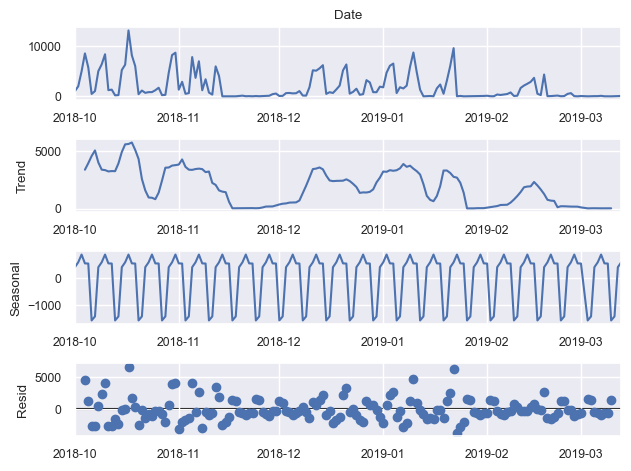

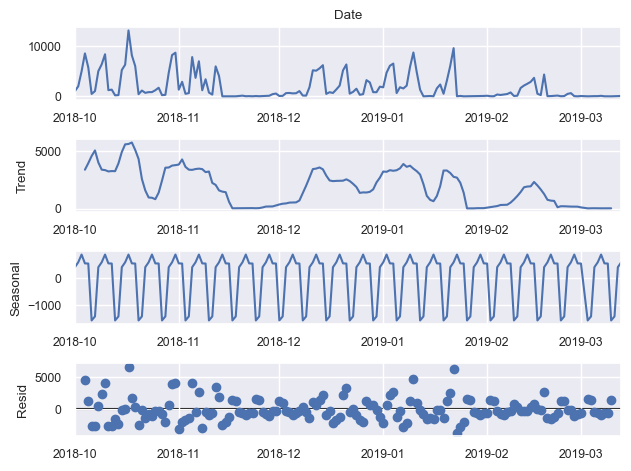

In [34]:
result.plot()

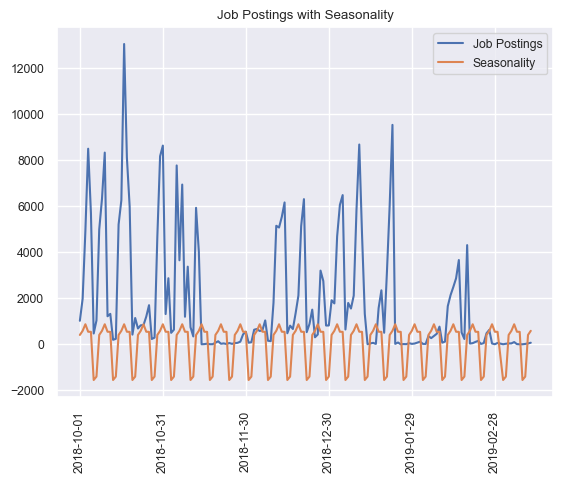

In [35]:
plt.title("Job Postings with Seasonality")
plt.plot(train, label="Job Postings")
plt.plot(result.seasonal, label="Seasonality")
plt.tick_params(axis='x', labelrotation=90)
plt.xticks(train.index[::30])
plt.legend()
plt.show()

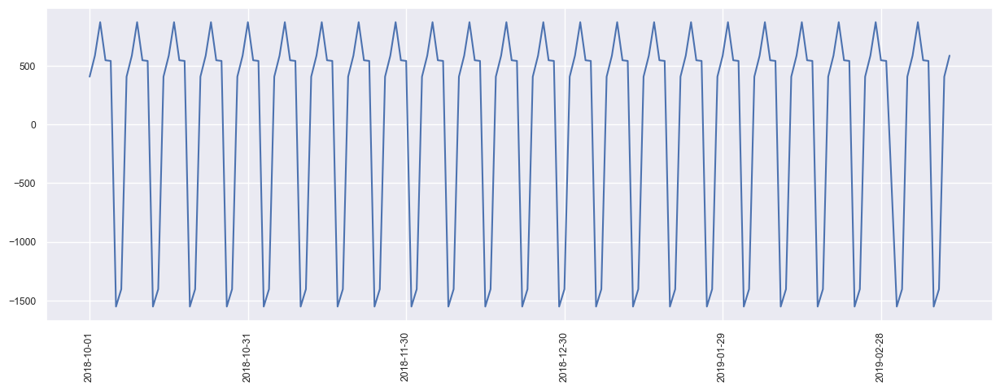

In [36]:
plt.figure(figsize=(15, 5))
plt.plot(result.seasonal)
plt.tick_params(axis='x', labelrotation=90)
plt.xticks(train.index[::30])
plt.show()

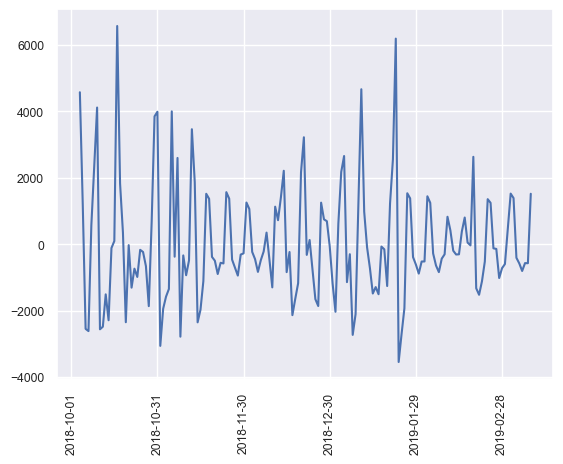

18.790473501653686


In [37]:
plt.plot(result.resid)
plt.tick_params(axis='x', labelrotation=90)
plt.xticks(train.index[::30])
plt.show()
print(result.resid.mean())

In [38]:
order = 2
coef = np.polyfit(np.arange(len(train)), test, order)
coef

array([ 3.15002446e-02, -2.38376454e+01,  3.52137942e+03])

In [39]:
poly_mdl = np.poly1d(coef)
poly_mdl

poly1d([ 3.15002446e-02, -2.38376454e+01,  3.52137942e+03])

In [40]:
trend = pd.Series(data = poly_mdl(np.arange(len(train))), index = train.index)

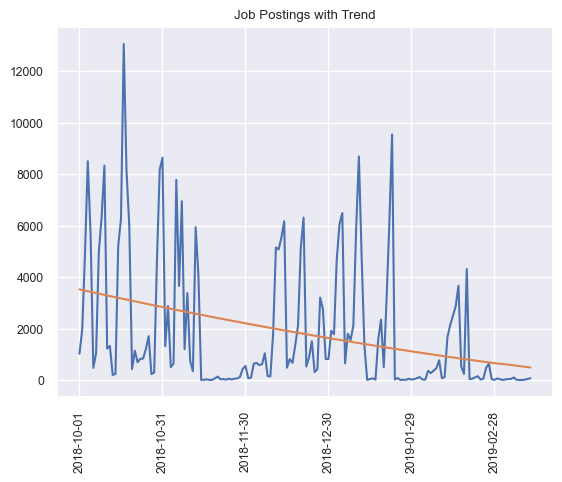

In [41]:
plt.plot(train)
plt.plot(trend)
plt.tick_params(axis='x', labelrotation=90)
plt.xticks(train.index[::30])
plt.title("Job Postings with Trend")
plt.show()

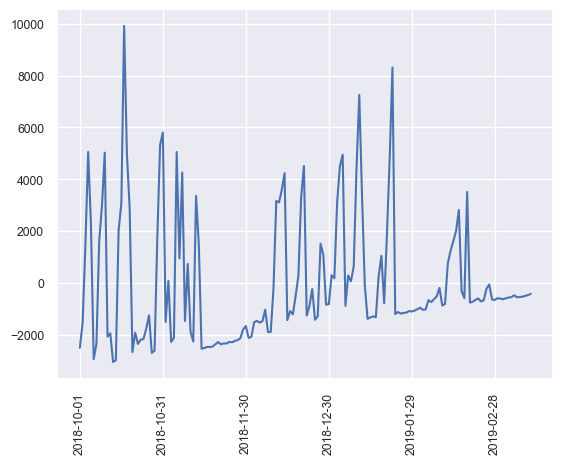

In [42]:
detrended = train - trend
plt.plot(detrended)

plt.tick_params(axis='x', labelrotation=90)
plt.xticks(train.index[::30])
plt.show()

### Trend of market

In [43]:
#print the value_counts of Date column where the Classification is equal to Retail & Consumer Products
print(df['Date'][df['Classification'] == 'Retail & Consumer Products'].value_counts())


2018-10-17 00:00:00+00:00    591
2018-10-31 00:00:00+00:00    333
2018-10-10 00:00:00+00:00    332
2018-10-30 00:00:00+00:00    310
2018-10-18 00:00:00+00:00    309
                            ... 
2018-12-09 00:00:00+00:00      2
2018-11-28 00:00:00+00:00      2
2018-11-23 00:00:00+00:00      1
2018-11-24 00:00:00+00:00      1
2018-11-25 00:00:00+00:00      1
Name: Date, Length: 70, dtype: int64


In [44]:
print(df['Classification'].unique())

['Retail & Consumer Products' 'Call Centre & Customer Service'
 'Hospitality & Tourism' 'Banking & Financial Services'
 'Manufacturing, Transport & Logistics' 'Sales'
 'Administration & Office Support' 'Trades & Services' 'Accounting'
 'Real Estate & Property' 'Healthcare & Medical'
 'Marketing & Communications' 'Government & Defence'
 'Information & Communication Technology' 'Education & Training'
 'Community Services & Development' 'Mining, Resources & Energy'
 'Human Resources & Recruitment' 'Insurance & Superannuation'
 'Engineering' 'CEO & General Management' 'Design & Architecture' 'Legal'
 'Construction' 'Sport & Recreation' 'Science & Technology'
 'Advertising, Arts & Media' 'Farming, Animals & Conservation'
 'Self Employment' 'Consulting & Strategy' nan]


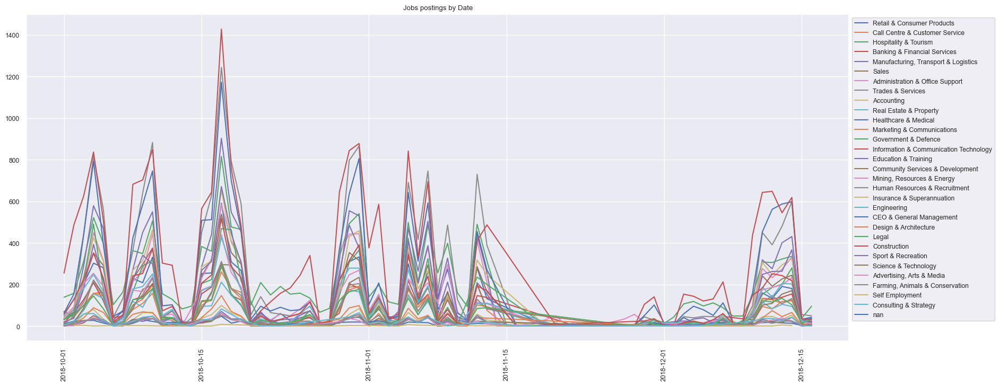

In [45]:
#train = df['Date'].value_counts().sort_index()
#test = df['Date'].value_counts().sort_index()
plt.figure(figsize=(20, 8))

#print the date assigned with how many duplicates there are
for classification in df['Classification'].unique():
    
    plt.plot(df['Date'][df['Classification'] == classification].value_counts().sort_index(), label=classification)
    # #on show every 10th date
    plt.tick_params(axis='x', labelrotation=90)
    
    #plt.xticks(train.index[::40])
plt.title("Jobs postings by Date")
plt.legend(bbox_to_anchor=(1, 1), loc='upper left', frameon=True)
plt.show()

In [46]:
#drop all NaN from Classification column
df = df.dropna(subset=['Classification'])

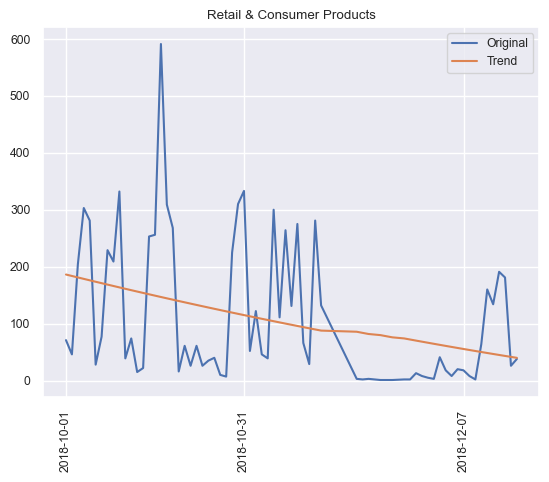

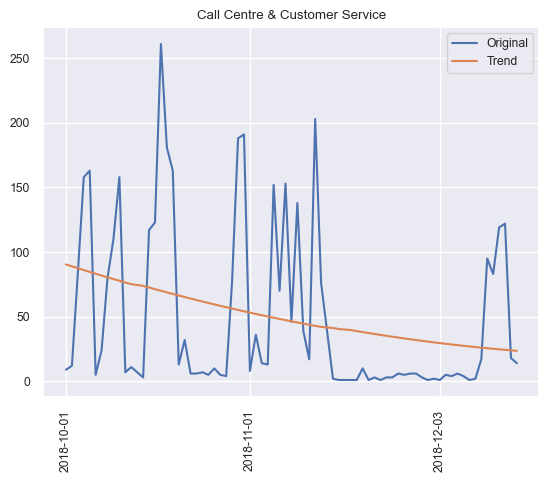

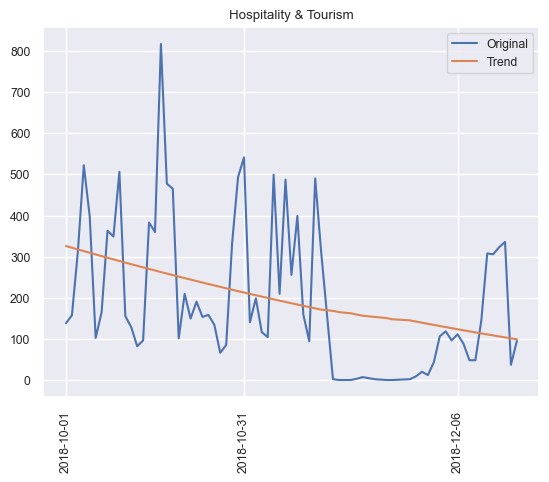

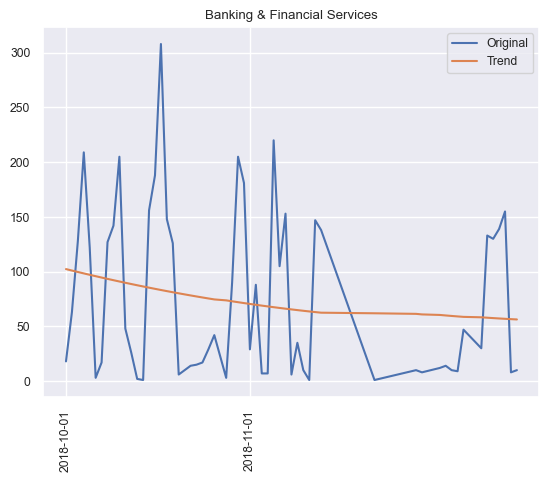

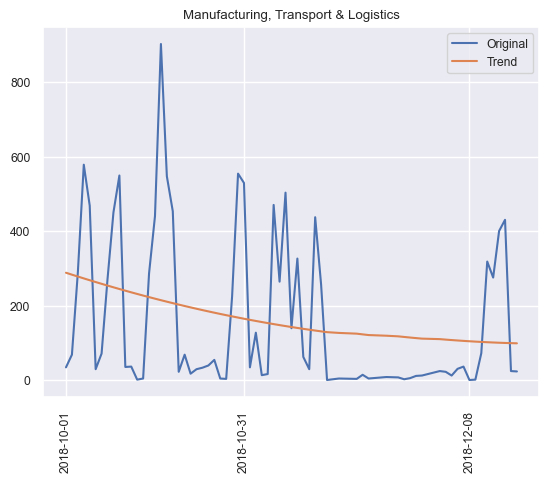

...

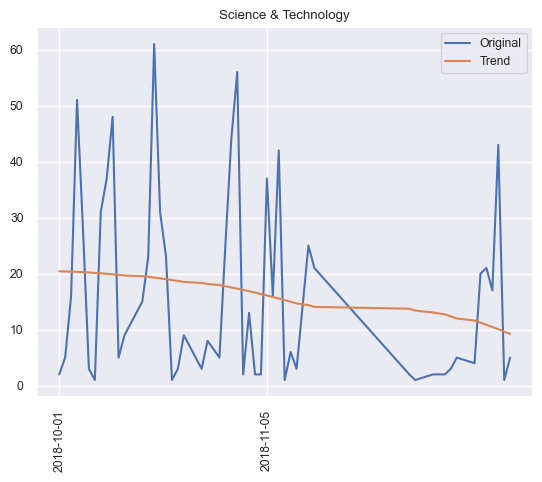

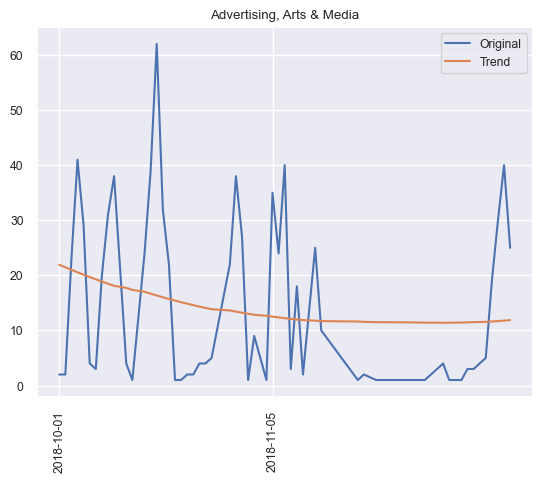

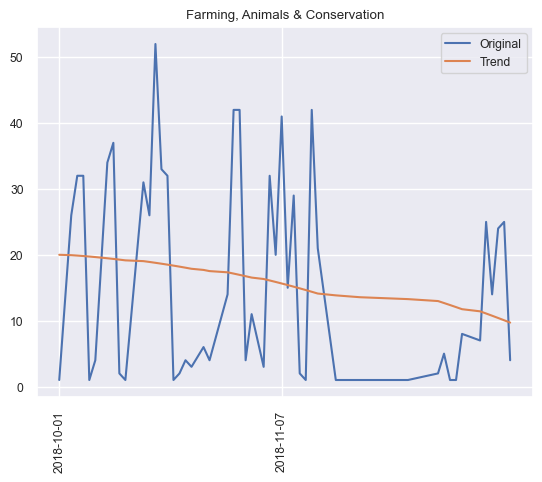

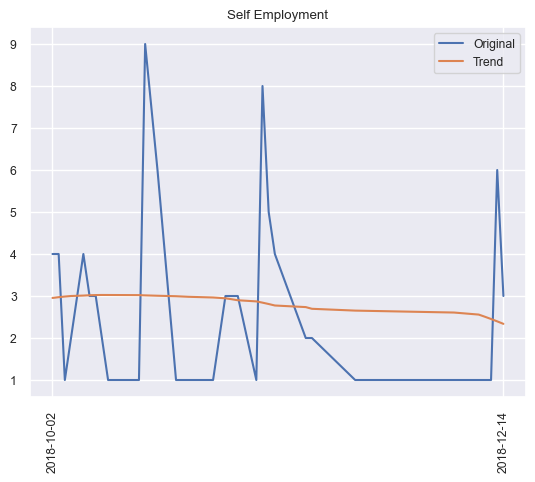

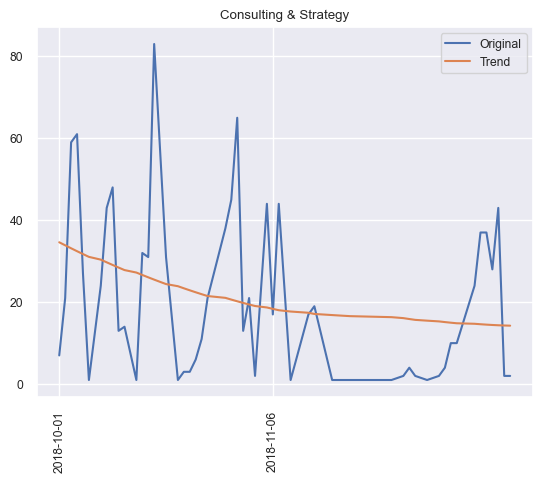

In [47]:
for classification in df['Classification'].unique():
    #if classification isnt a string continue
    if type(classification) != str:
        continue
    train = df['Date'][df['Classification'] == classification].value_counts().sort_index()
    result = seasonal_decompose(train, model='additive', period=7)

    order = 2
    coef = np.polyfit(np.arange(len(train)), train, order)
    poly_mdl = np.poly1d(coef)
    trend = pd.Series(data = poly_mdl(np.arange(len(train))), index = train.index)
    
    plt.title(classification)
    plt.plot(train, label='Original')
    #plt.plot(result.trend, label='Weekly period trend')
    plt.plot(trend, label='Trend')
    #plt.plot(result.seasonal, label='Seasonal')
    plt.legend()
    plt.tick_params(axis='x', labelrotation=90)
    plt.xticks(train.index[::30])
    plt.show()

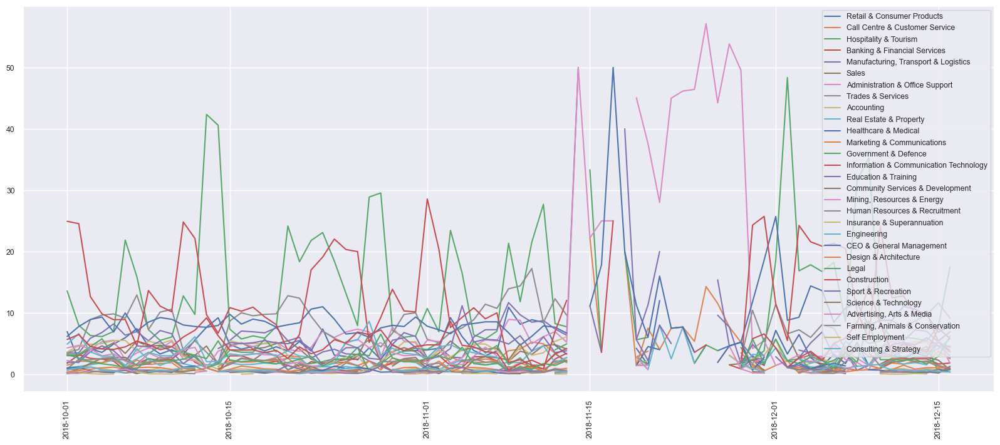

In [48]:
trend = df.groupby('Date').Classification.value_counts()
trend.head()

plt.figure(figsize=(20, 8))
#plot the amount of Classificiation that equal to Retail & Consumer Products as a percentage of the total jobs posted per day
for classifications in df['Classification'].unique():
    result = df['Date'][df['Classification'] == classifications].value_counts().sort_index() / df['Date'].value_counts().sort_index() * 100

    plt.plot(result, label=classifications)

    
    plt.tick_params(axis='x', labelrotation=90)

plt.legend()
plt.show()


In [49]:
df2 = df.reset_index()
df2 = df2.sort_values('Date')
start_date = df2['Date'].min()

In [50]:
df2.head()

,index,Unnamed: 0,Date,Location,Area,Classification,SubClassification,Requirement,FullDescription,LowestSalary,HighestSalary,ClassificationLumped,LocationLumped,Salary,SalaryRange
22938,22938,22938,2018-10-01 00:00:00+00:00,Melbourne,CBD & Inner Suburbs,Construction,Foreperson/Supervisors,Looking for a Site Manager experienced in deli...,<br>\n <div><strong>The company:</stron...,150,200,Construction,Melbourne,175.0,150-200
5444,5444,5444,2018-10-01 00:00:00+00:00,Melbourne,Bayside & South Eastern Suburbs,Retail & Consumer Products,Retail Assistants,Kidstuff educational toy stores. Join us for t...,<p>Help us grow our brand!<br><br>With over 55...,30,40,Retail & Consumer Products,Melbourne,35.0,30-40
5443,5443,5443,2018-10-01 00:00:00+00:00,Brisbane,Northern Suburbs,Hospitality & Tourism,Waiting Staff,Training provided! Fabulous exciting team! Fan...,Do you enjoy working within a cool and collect...,30,40,Hospitality & Tourism,Brisbane,35.0,30-40
5442,5442,5442,2018-10-01 00:00:00+00:00,Gold Coast,NaN,Retail & Consumer Products,Retail Assistants,Join the team in providing amazing customer se...,&nbsp;&nbsp;&nbsp;&nbsp;<br>\n <p>At OP...,30,40,Retail & Consumer Products,Gold Coast,35.0,30-40
5441,5441,5441,2018-10-01 00:00:00+00:00,Melbourne,Bayside & South Eastern Suburbs,Retail & Consumer Products,Retail Assistants,"Seeking dynamic, customer service driven brand...","<p style=""text-align:justify;""><strong>About t...",30,40,Retail & Consumer Products,Melbourne,35.0,30-40


In [51]:
df2['Weeks'] = ((df2['Date'] - start_date).dt.days // 7).astype(int) + 1
print(df2['Weeks'].unique())

[ 1  2  3  4  5  6  7  8  9 10 11]


In [52]:
# drop Unnamed: 0 column
df2 = df2.drop(['Unnamed: 0'], axis=1)

In [53]:
df2.tail()

,index,Date,Location,Area,Classification,SubClassification,Requirement,FullDescription,LowestSalary,HighestSalary,ClassificationLumped,LocationLumped,Salary,SalaryRange,Weeks
158075,158075,2018-12-16 00:00:00+00:00,Sydney,Parramatta & Western Suburbs,Hospitality & Tourism,Waiting Staff,A restaurant in Blacktown is seeking a casual ...,NaN,0,30,Hospitality & Tourism,Sydney,15.0,0-30,11
158074,158074,2018-12-16 00:00:00+00:00,ACT,NaN,Information & Communication Technology,Business/Systems Analysts,Business Analyst - Agile SDLC - 6+ Month Contr...,NaN,0,30,Information & Communication Technology,ACT,15.0,0-30,11
158073,158073,2018-12-16 00:00:00+00:00,Cairns & Far North,NaN,Hospitality & Tourism,Chefs/Cooks,Award Winning Fitzroy Island Resort is current...,NaN,0,30,Hospitality & Tourism,Other,15.0,0-30,11
158079,158079,2018-12-16 00:00:00+00:00,West Gippsland & Latrobe Valley,NaN,Healthcare & Medical,Dental,Experienced dentist required for a full time p...,NaN,0,30,Healthcare & Medical,Other,15.0,0-30,11
157980,157980,2018-12-16 00:00:00+00:00,Mornington Peninsula & Bass Coast,NaN,Retail & Consumer Products,Retail Assistants,Whether they’re racing to fill shelves or scan...,NaN,0,30,Retail & Consumer Products,Other,15.0,0-30,11


In [54]:
print(df['Date'][df['Classification'] == 'Retail & Consumer Products'].value_counts().sort_index())
# do the same as the line above but group date by week

2018-10-01 00:00:00+00:00     71
2018-10-02 00:00:00+00:00     46
2018-10-03 00:00:00+00:00    204
2018-10-04 00:00:00+00:00    303
2018-10-05 00:00:00+00:00    281
                            ... 
2018-12-12 00:00:00+00:00    134
2018-12-13 00:00:00+00:00    191
2018-12-14 00:00:00+00:00    181
2018-12-15 00:00:00+00:00     26
2018-12-16 00:00:00+00:00     38
Name: Date, Length: 70, dtype: int64


In [55]:
print("Number of Engineering postings by week:\n", df2['Weeks'][df2['Classification'] == "Engineering"].value_counts().sort_index())

print("\nTotal numbe of postings by week: \n", df2['Weeks'].value_counts().sort_index())

Number of Engineering postings by week:
 1      809
2      762
3     1301
4      232
5      967
6      612
7      220
8        4
9       32
10     113
11     857
Name: Weeks, dtype: int64

Total numbe of postings by week: 
 1     23673
2     22641
3     40213
4      5779
5     26801
6     24041
7     10028
8       359
9      1373
10     3830
11    24785
Name: Weeks, dtype: int64


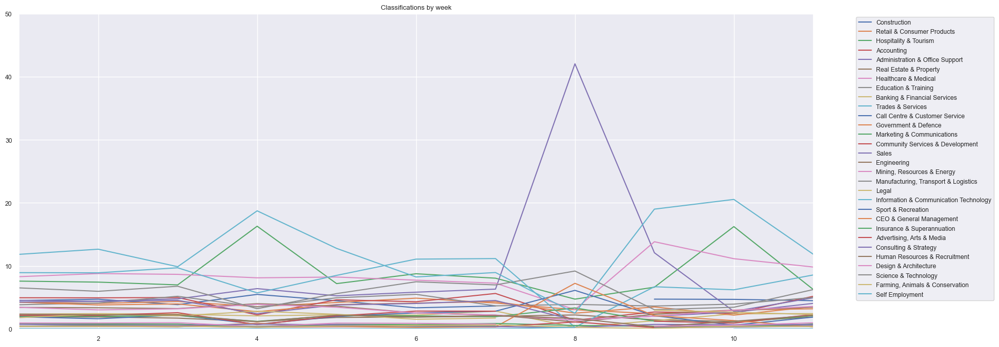

In [56]:


plt.figure(figsize=(20, 8))
#plot the amount of Classificiation that equal to Retail & Consumer Products as a percentage of the total jobs posted per day
for classifications in df2['Classification'].unique():
    result = df2['Weeks'][df2['Classification'] == classifications].value_counts().sort_index() / df2['Weeks'].value_counts().sort_index() * 100
    # if result is NaN assign to 0
    #result = result.fillna(0)
    
    plt.plot(result, label=classifications)
    # plot moving average

    
    
    
    #plt.tick_params(axis='x', labelrotation=90)
plt.title("Classifications by week")
plt.ylim(0, 50)
plt.xlim(1, 11)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=True)
plt.show()
#plt.plot(df['Date'][df['Classification'] == 'Retail & Consumer Products'].value_counts().sort_index() / df['Date'].value_counts().sort_index() * 100)

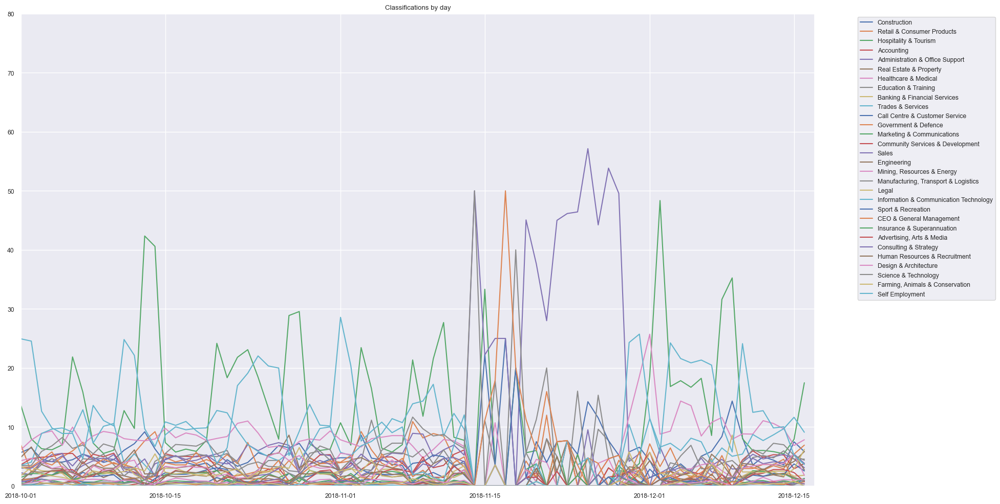

In [57]:


plt.figure(figsize=(20, 12))
#plot the amount of Classificiation that equal to Retail & Consumer Products as a percentage of the total jobs posted per day
for classifications in df2['Classification'].unique():
    daily = df2['Date'][df2['Classification'] == classifications].value_counts().sort_index() / df2['Date'].value_counts().sort_index() * 100
    # if result is NaN assign to 0
    daily = daily.fillna(0)
    
    #plt.plot(daily.rolling(7).mean(), label="Moving average")
    plt.plot(daily, label=classifications)
    
    
    #plt.tick_params(axis='x', labelrotation=90)
plt.title("Classifications by day")
plt.ylim(0, 80)
# set x limit to not show dates past 2018-12-31
plt.xlim([datetime.date(2018,10, 1), datetime.date(2018, 12, 17)])
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=True)
plt.show()

#plt.plot(df['Date'][df['Classification'] == 'Retail & Consumer Products'].value_counts().sort_index() / df['Date'].value_counts().sort_index() * 100)

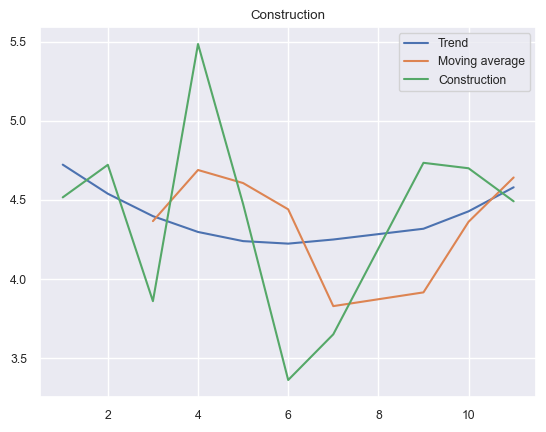

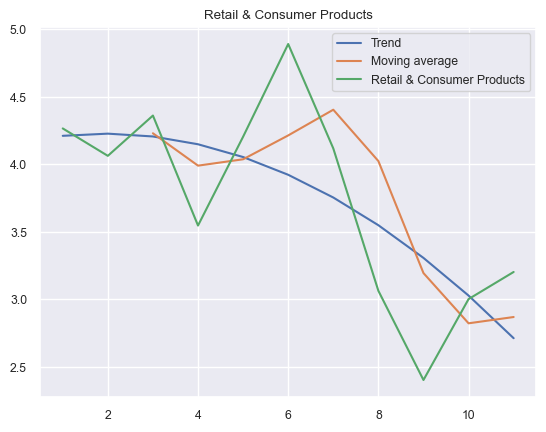

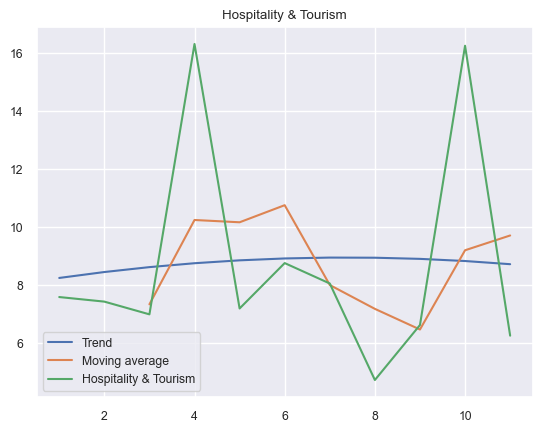

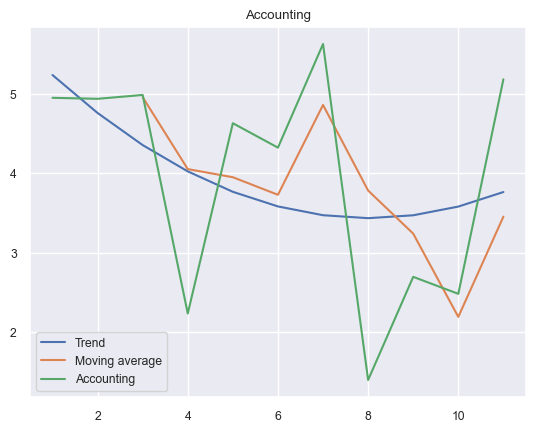

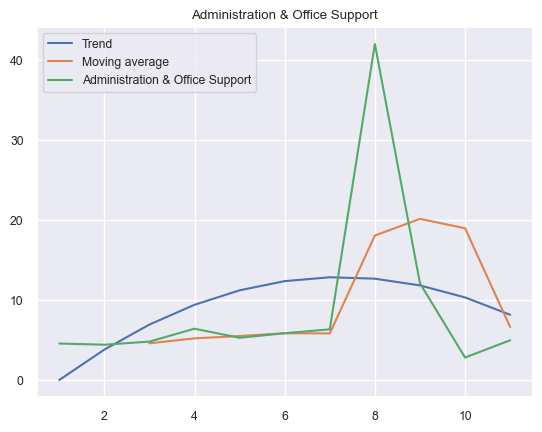

...

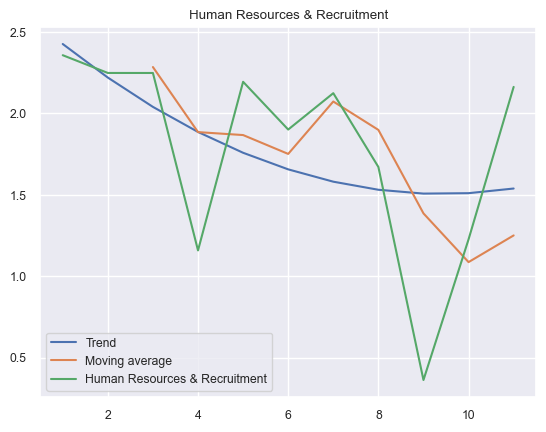

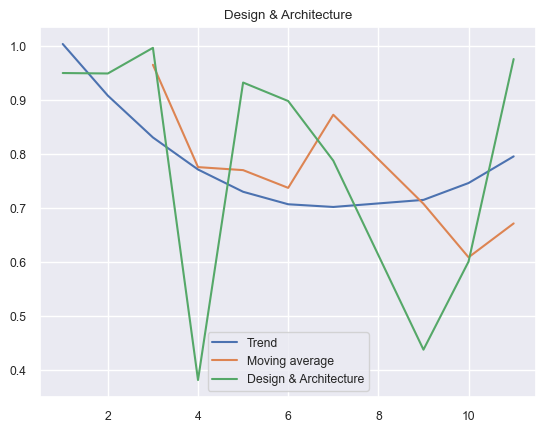

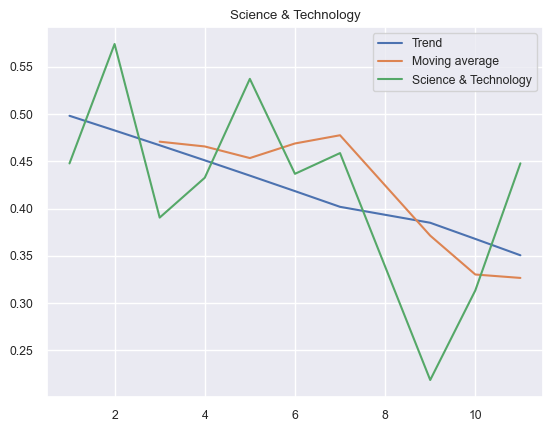

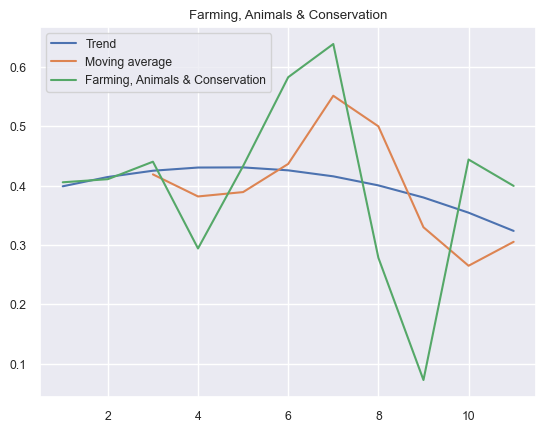

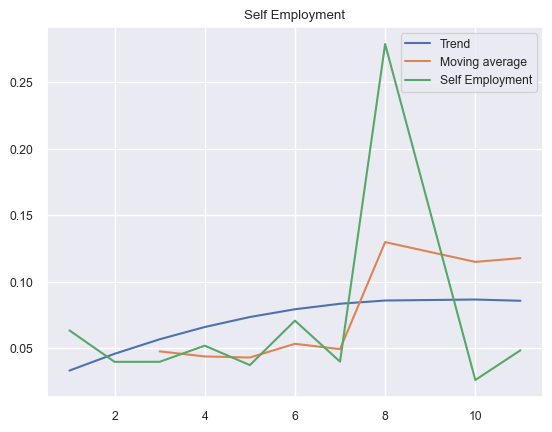

In [58]:


#plt.figure(figsize=(20, 8))
#plot the amount of Classificiation that equal to Retail & Consumer Products as a percentage of the total jobs posted per day
for classifications in df2['Classification'].unique():
    weekly = df2['Weeks'][df2['Classification'] == classifications].value_counts().sort_index() / df2['Weeks'].value_counts().sort_index() * 100
    # if result is NaN assign to 0
    #result = result.fillna(0)
    weekly.dropna(inplace=True)
    order = 2
    coef = np.polyfit(np.arange(len(weekly)), weekly, order)
    poly_mdl = np.poly1d(coef)
    trend = pd.Series(data = poly_mdl(np.arange(len(weekly))), index = weekly.index)
    plt.plot(trend, label="Trend")
    plt.plot(weekly.rolling(3).mean(), label="Moving average")
    plt.plot(weekly, label=classifications)
    plt.title(classifications)
    #plt.ylim(0, 50)
    plt.legend()
    plt.show()
    
    #plt.tick_params(axis='x', labelrotation=90)


#plt.plot(df['Date'][df['Classification'] == 'Retail & Consumer Products'].value_counts().sort_index() / df['Date'].value_counts().sort_index() * 100)

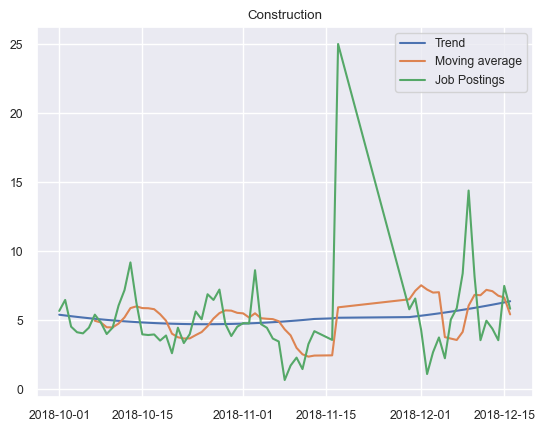

Mean of Construction is 5.146515864047934


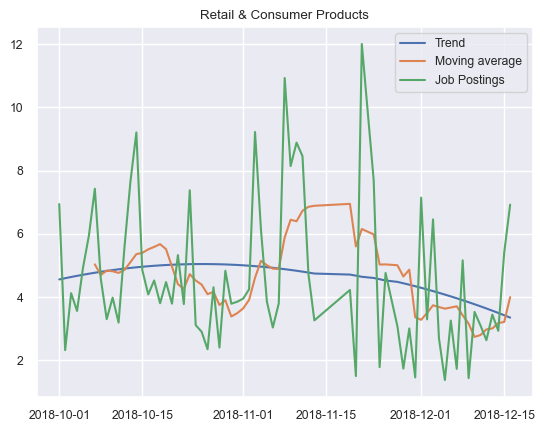

Mean of Retail & Consumer Products is 4.611152086029775


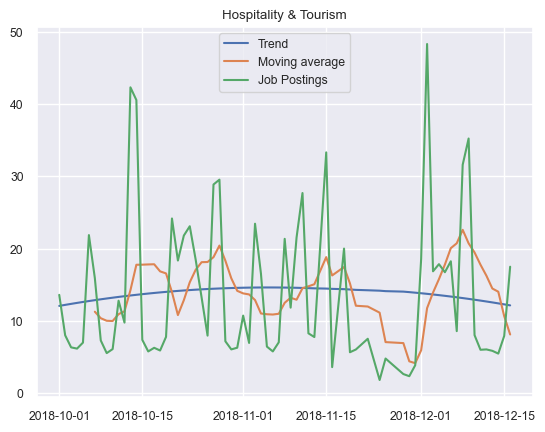

Mean of Hospitality & Tourism is 13.747723217845191


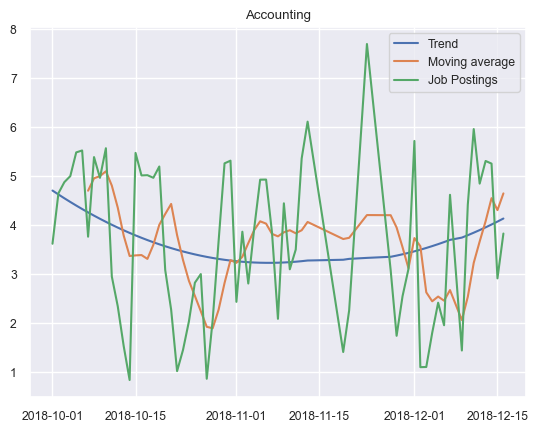

Mean of Accounting is 3.6474856019477238


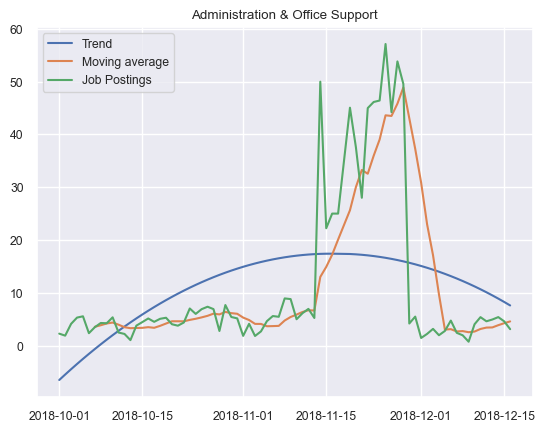

Mean of Administration & Office Support is 11.116630682218636


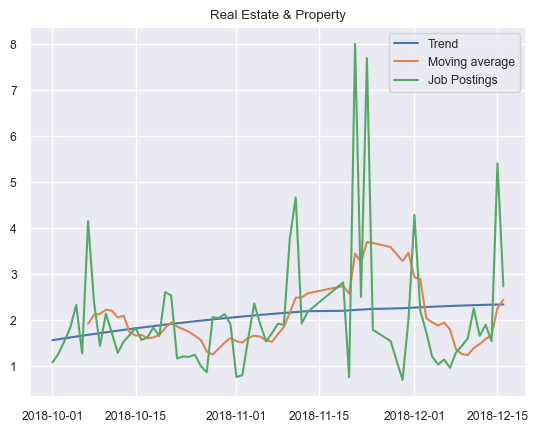

Mean of Real Estate & Property is 2.047036923573322


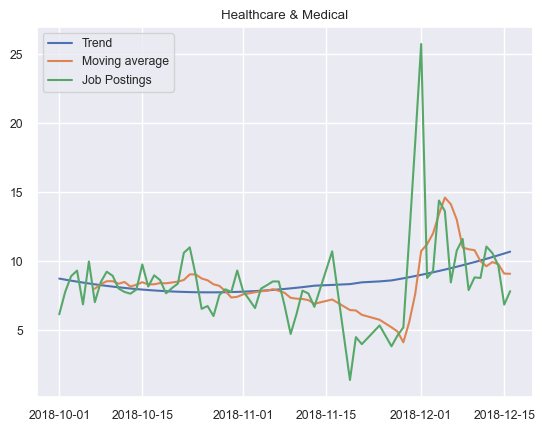

Mean of Healthcare & Medical is 8.510134975253036


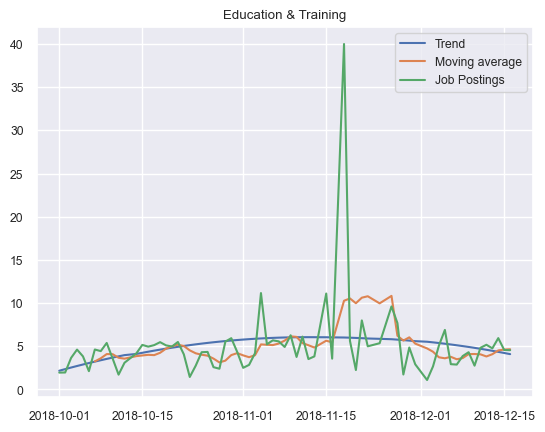

Mean of Education & Training is 5.001558196033941


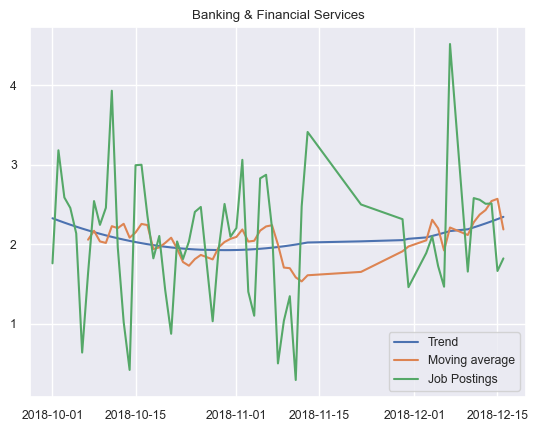

Mean of Banking & Financial Services is 2.067042074824295


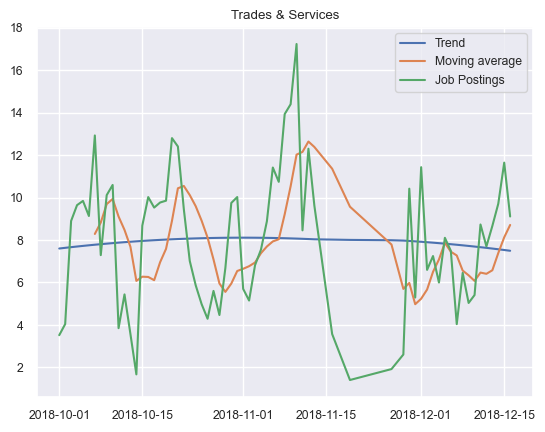

Mean of Trades & Services is 7.9150676868415015


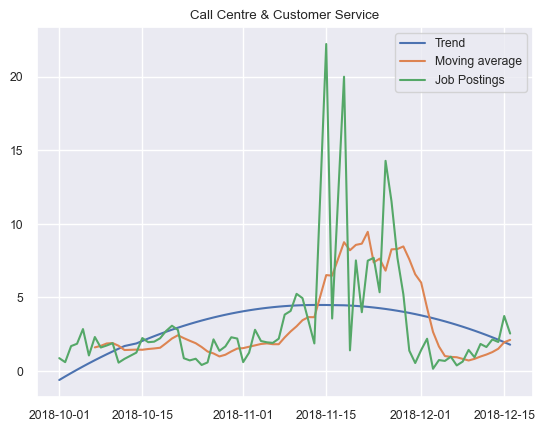

Mean of Call Centre & Customer Service is 3.094651996532986


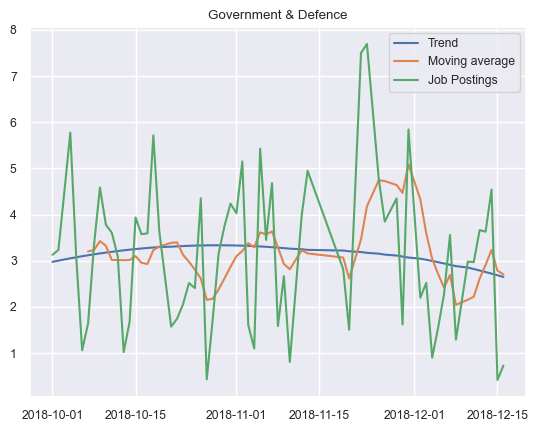

Mean of Government & Defence is 3.145462144125533


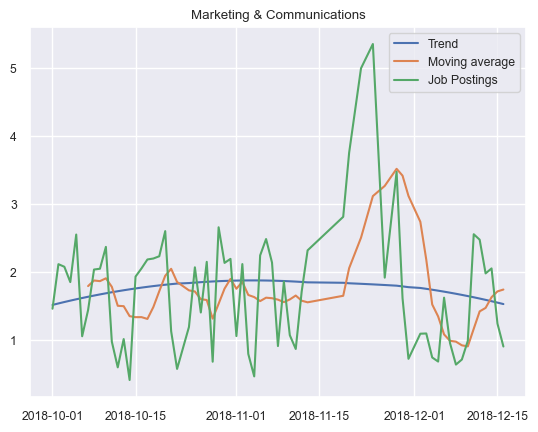

Mean of Marketing & Communications is 1.7607323799097887


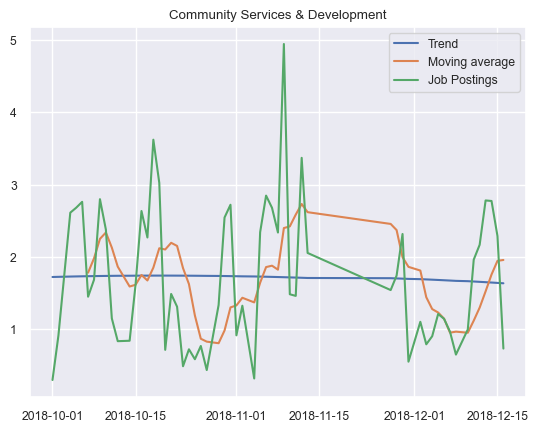

Mean of Community Services & Development is 1.7114034584117974


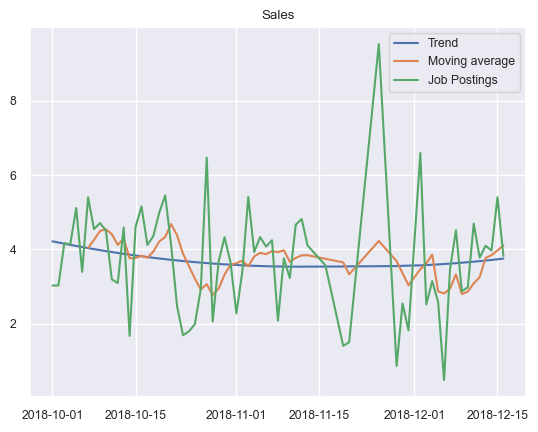

Mean of Sales is 3.712174878073456


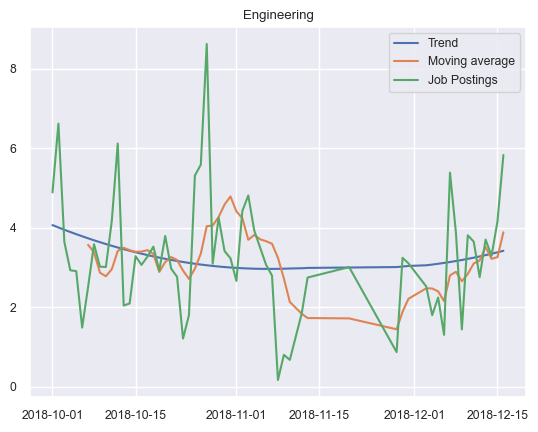

Mean of Engineering is 3.253464523210291


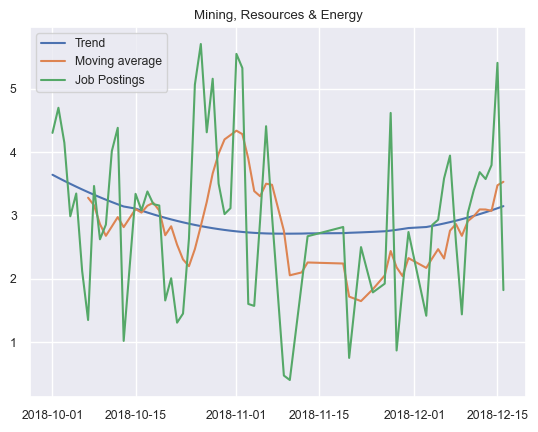

Mean of Mining, Resources & Energy is 2.960977514507032


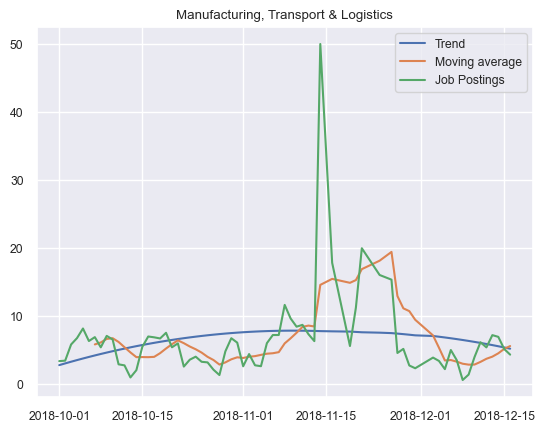

Mean of Manufacturing, Transport & Logistics is 6.50734103503758


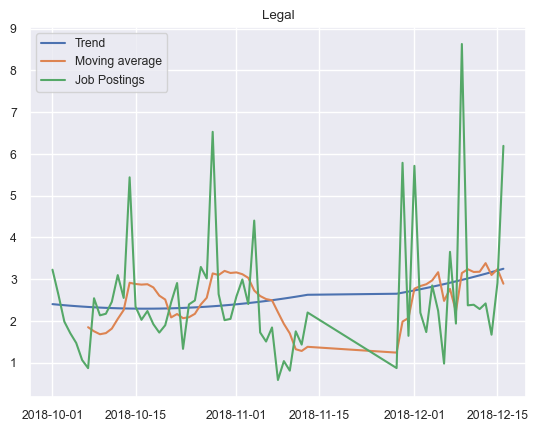

Mean of Legal is 2.5446857228642834


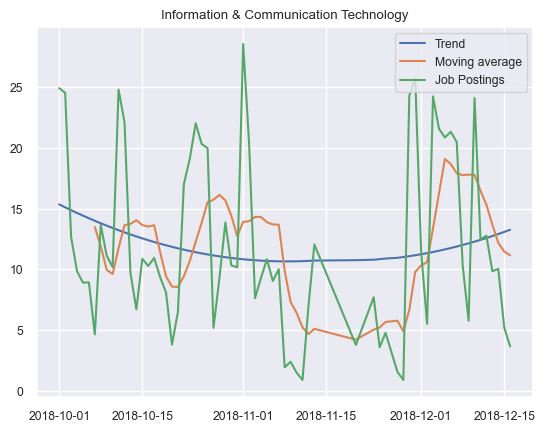

Mean of Information & Communication Technology is 11.95359916454564


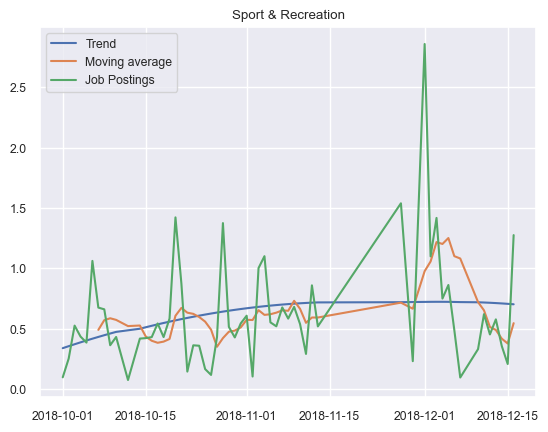

Mean of Sport & Recreation is 0.6160877787043347


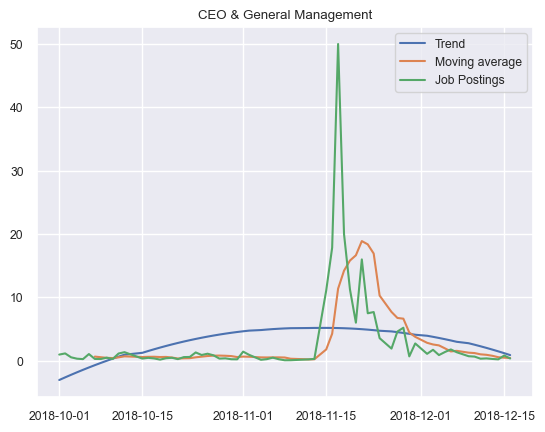

Mean of CEO & General Management is 2.937479178790406


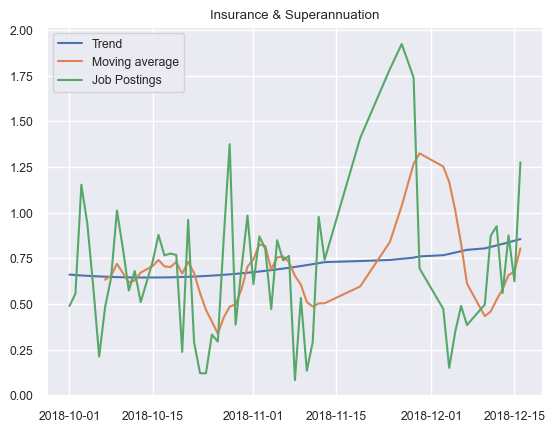

Mean of Insurance & Superannuation is 0.7017387851800112


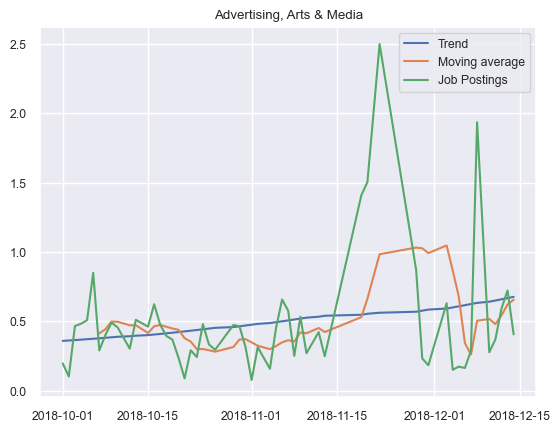

Mean of Advertising, Arts & Media is 0.4895597791957286


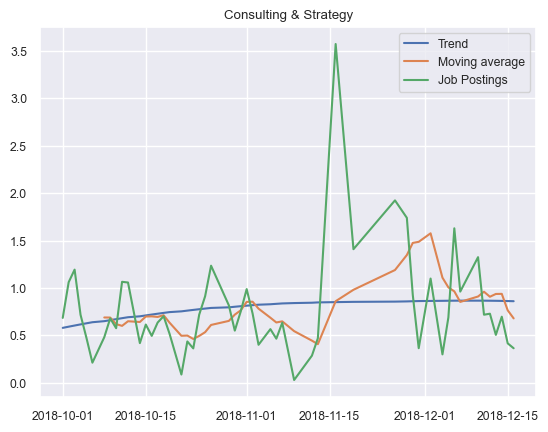

Mean of Consulting & Strategy is 0.7808567099191187


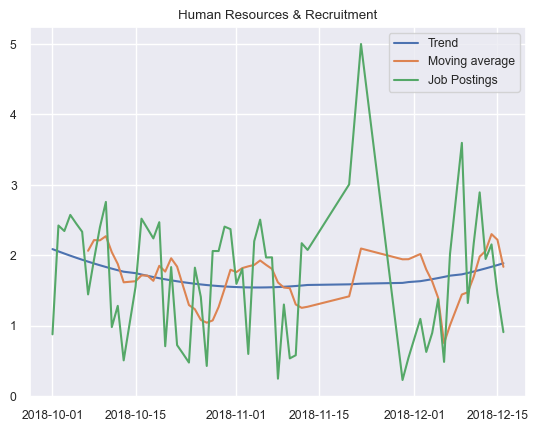

Mean of Human Resources & Recruitment is 1.701289293445674


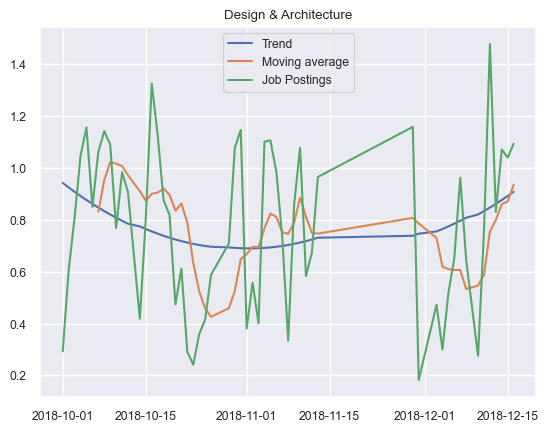

Mean of Design & Architecture is 0.7708680308293773


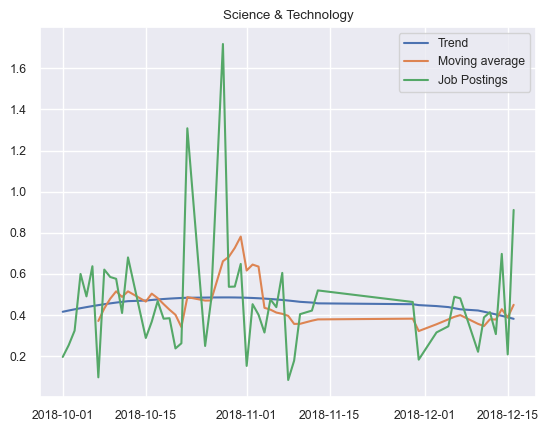

Mean of Science & Technology is 0.4545645702019267


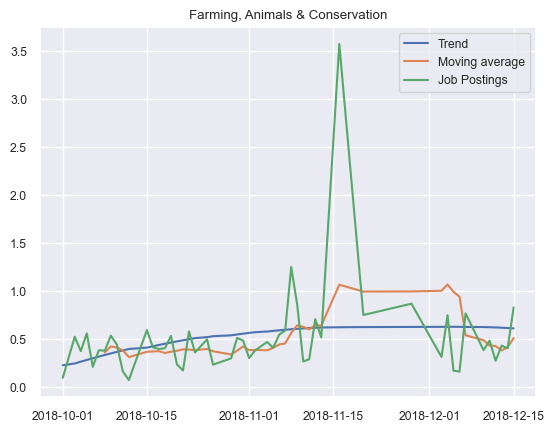

Mean of Farming, Animals & Conservation is 0.515301160286463


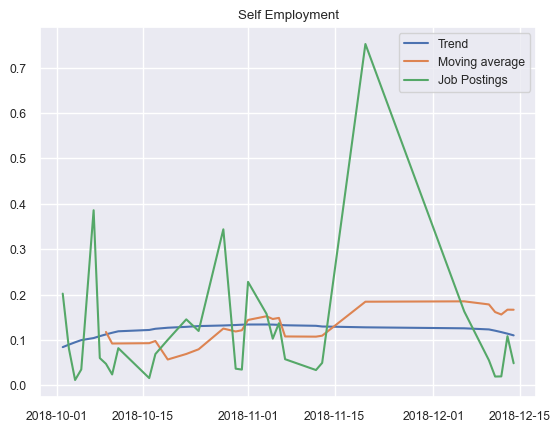

Mean of Self Employment is 0.12017826058099822


In [59]:


#plt.figure(figsize=(20, 8))
#plot the amount of Classificiation that equal to Retail & Consumer Products as a percentage of the total jobs posted per day
for classifications in df2['Classification'].unique():
    
    daily = df2['Date'][df2['Classification'] == classifications].value_counts().sort_index() / df2['Date'].value_counts().sort_index() * 100
    daily.dropna(inplace=True)

    order = 2
    coef = np.polyfit(np.arange(len(daily)), daily, order)
    poly_mdl = np.poly1d(coef)
    trend = pd.Series(data = poly_mdl(np.arange(len(daily))), index = daily.index)
    plt.plot(trend, label="Trend")

    
    plt.plot(daily.rolling(7).mean(), label="Moving average")
    plt.plot(daily, label="Job Postings")
    plt.title(classifications)
    #plt.ylim(0, 50)
    plt.legend()
    plt.show()

    print("Mean of", classifications, "is", daily.mean())
    #plt.tick_params(axis='x', labelrotation=90)


#plt.plot(df['Date'][df['Classification'] == 'Retail & Consumer Products'].value_counts().sort_index() / df['Date'].value_counts().sort_index() * 100)

In [60]:
#sort the date column
df2 = df2.sort_values('Date')
df2.tail()

,index,Date,Location,Area,Classification,SubClassification,Requirement,FullDescription,LowestSalary,HighestSalary,ClassificationLumped,LocationLumped,Salary,SalaryRange,Weeks
157974,157974,2018-12-16 00:00:00+00:00,Sydney,"CBD, Inner West & Eastern Suburbs",Banking & Financial Services,Banking - Corporate & Institutional,Seeking an entry level position with a well es...,NaN,0,30,Banking & Financial Services,Sydney,15.0,0-30,11
157975,157975,2018-12-16 00:00:00+00:00,Sydney,"CBD, Inner West & Eastern Suburbs",Sales,Sales Representatives/Consultants,As Australia's leading graduate placement firm...,NaN,0,30,Sales,Sydney,15.0,0-30,11
157976,157976,2018-12-16 00:00:00+00:00,Melbourne,Bayside & South Eastern Suburbs,Sales,Sales Representatives/Consultants,3 Month Full Time Contract - Working Holiday V...,NaN,0,30,Sales,Melbourne,15.0,0-30,11
157970,157970,2018-12-16 00:00:00+00:00,Melbourne,Bayside & South Eastern Suburbs,Hospitality & Tourism,Chefs/Cooks,A cafe/caterer in Cranbourne is seeking a casu...,NaN,0,30,Hospitality & Tourism,Melbourne,15.0,0-30,11
157980,157980,2018-12-16 00:00:00+00:00,Mornington Peninsula & Bass Coast,NaN,Retail & Consumer Products,Retail Assistants,Whether they’re racing to fill shelves or scan...,NaN,0,30,Retail & Consumer Products,Other,15.0,0-30,11


### Seasonality of Job postings

In [61]:
# create new dataframe with dates as indexes and counts of job postings as values
df_dates = df['Date'].value_counts().to_frame()
# sort the dataframe by index
df_dates = df_dates.sort_index()
# create a new column with the cumulative sum of job postings
df_dates['CumulativeSum'] = df_dates['Date'].cumsum()
# create a new column with the percentage of job postings
df_dates['Percentage'] = df_dates['CumulativeSum'] / df_dates['Date'].sum() * 100
df_dates.head(10)


,Date,CumulativeSum,Percentage
2018-10-01 00:00:00+00:00,1023,1023,0.557423
2018-10-02 00:00:00+00:00,1980,3003,1.636307
2018-10-03 00:00:00+00:00,4945,7948,4.330792
2018-10-04 00:00:00+00:00,8506,16454,8.965634
2018-10-05 00:00:00+00:00,5711,22165,12.077505
2018-10-06 00:00:00+00:00,471,22636,12.334149
2018-10-07 00:00:00+00:00,1037,23673,12.899201
2018-10-08 00:00:00+00:00,4995,28668,15.620930
2018-10-09 00:00:00+00:00,6329,34997,19.069544
2018-10-10 00:00:00+00:00,8337,43334,23.612299


The data set includes posting across a 7 day period, from Monday the 1st of October 2018, to Sunday the 7th of October 2018. This severely limits the scope and applicability of observations from this dataset. However, in this dataset a clear trend it seen throughout the week, where Job postings are low through the weekend and beginning of the week but steadily increase, reaching a peak on Friday.

Text(0, 0.5, 'Number of Job Postings')

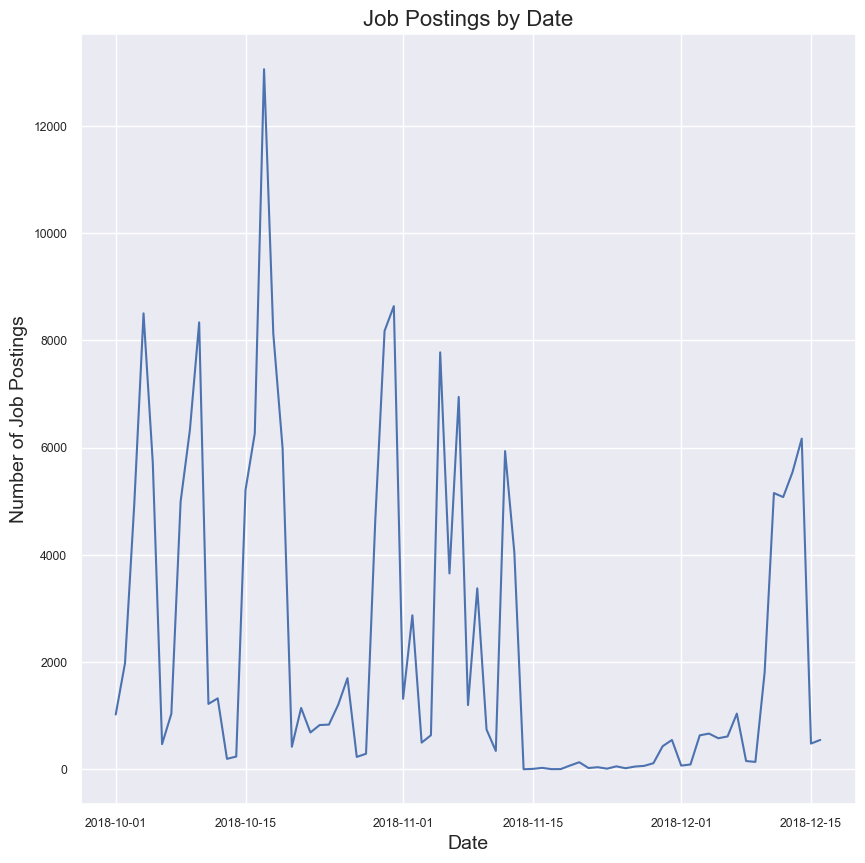

In [62]:
# plot and display a chart for date column
plt.figure(figsize=(10,10))
plt.plot(df_dates.index, df_dates['Date']) 
plt.title("Job Postings by Date", fontsize=16)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Number of Job Postings", fontsize=14)


In [63]:
# find how many postings do not have a date
df['Date'].isnull().sum()
# find how many postings do not have a Classification
df['Classification'].isnull().sum()
# check for all posting in 2019 which have classifications
df_2019 = df[df['Date'].dt.year == 2019]
df_2019['Classification'].notnull().sum()

0

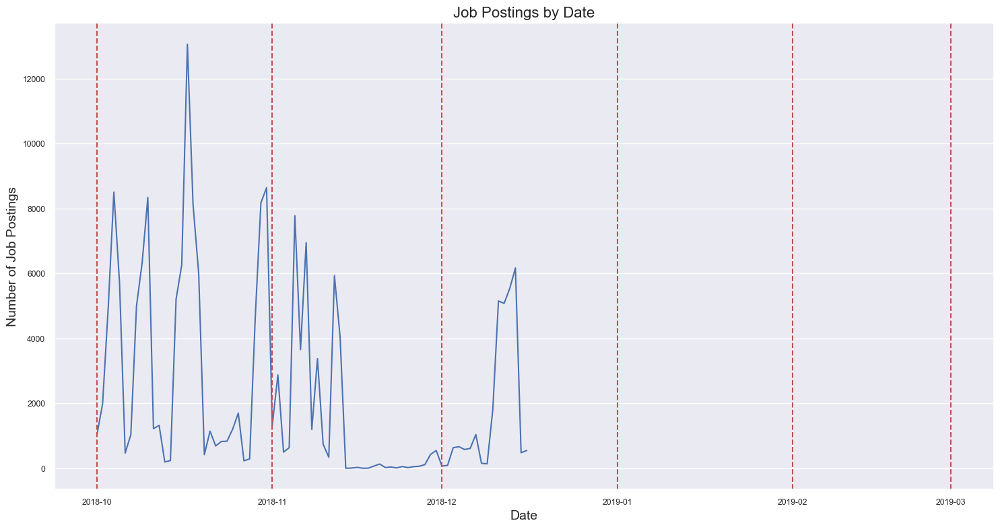

In [64]:
# Replot Job Posting By date with lines at month markers
plt.figure(figsize=(18,9))
plt.plot(df_dates.index, df_dates['Date'])
plt.title("Job Postings by Date", fontsize=16)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Number of Job Postings", fontsize=14)
plt.axvline(pd.to_datetime('2018-10-01'), c='r', linestyle='--')
plt.axvline(pd.to_datetime('2018-11-01'), c='r', linestyle='--')
plt.axvline(pd.to_datetime('2018-12-01'), c='r', linestyle='--')
plt.axvline(pd.to_datetime('2019-01-01'), c='r', linestyle='--')
plt.axvline(pd.to_datetime('2019-02-01'), c='r', linestyle='--')
plt.axvline(pd.to_datetime('2019-03-01'), c='r', linestyle='--')
plt.show()

In [65]:
# calculate percentage of job postings are

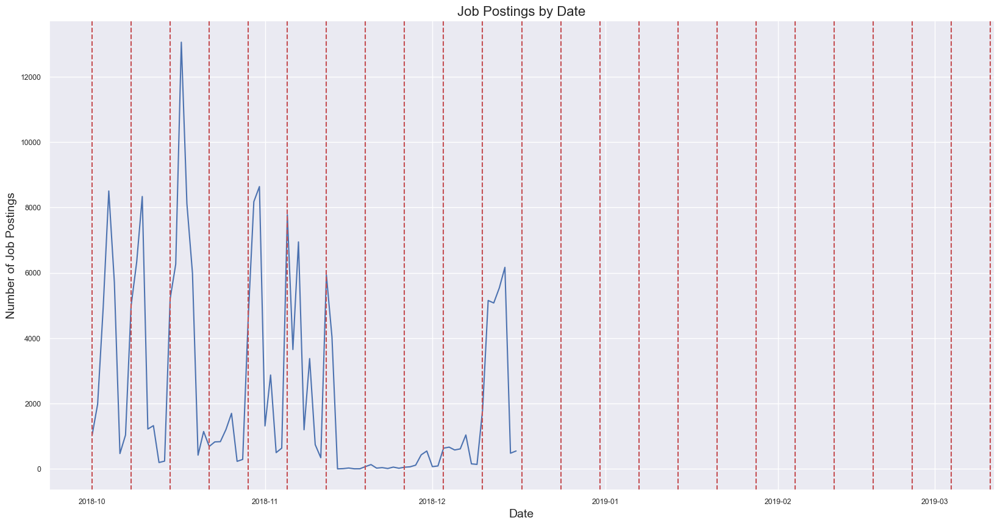

In [66]:
# Replot Job Posting By date with lines at Monday
# Define the dates for the lines
line_dates = [
    '2018-10-01', '2018-10-08', '2018-10-15', '2018-10-22', '2018-10-29',
    '2018-11-05', '2018-11-12', '2018-11-19', '2018-11-26', '2018-12-03',
    '2018-12-10', '2018-12-17', '2018-12-24', '2018-12-31', '2019-01-07',
    '2019-01-14', '2019-01-21', '2019-01-28', '2019-02-04', '2019-02-11',
    '2019-02-18', '2019-02-25', '2019-03-04', '2019-03-11'
]

# Convert dates to datetime objects
line_dates = [pd.to_datetime(date) for date in line_dates]

plt.show()
plt.figure(figsize=(20,10))
plt.plot(df_dates.index, df_dates['Date'])
plt.title("Job Postings by Date", fontsize=16)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Number of Job Postings", fontsize=14)
# Add lines at the specified dates
for date in line_dates:
    plt.axvline(date, c='r', linestyle='--')
plt.show()

[ 1  2  3  4  5  6  7  8  9 10 11]


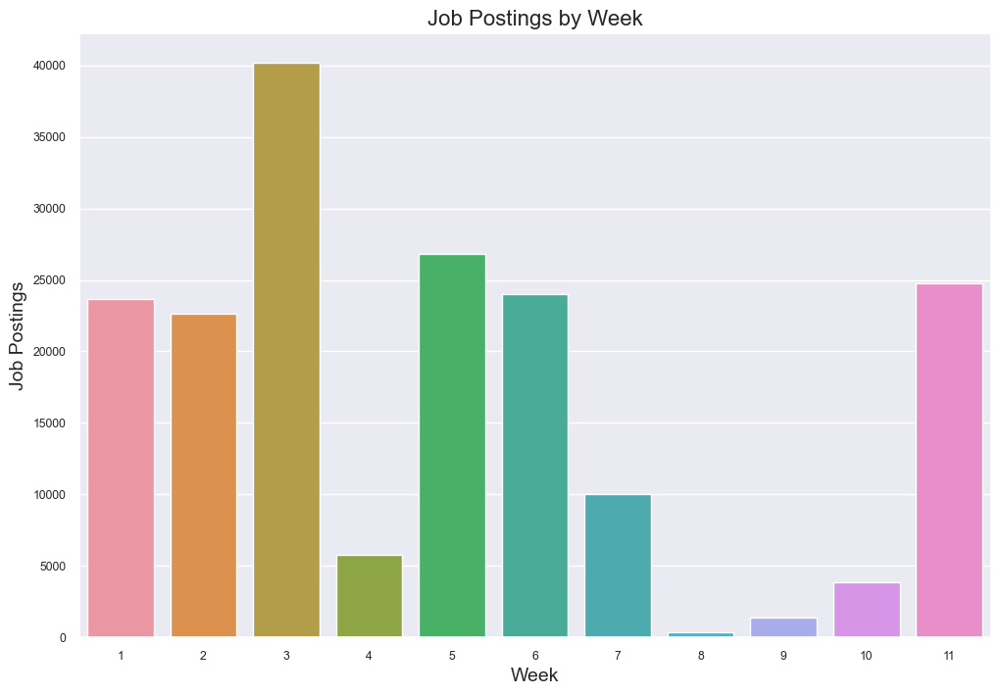

In [67]:
# Sort by Date and calculate the start date
df2 = df.reset_index()
df2 = df2.sort_values('Date')
start_date = df2['Date'].min()

# Create 'Weeks' column with week numbers
df2['Weeks'] = ((df2['Date'] - start_date).dt.days // 7).astype(int) + 1
print(df2['Weeks'].unique())

plt.figure(figsize=(12,8))
sns.countplot(x='Weeks', data=df2)
plt.title("Job Postings by Week", fontsize=16)
plt.xlabel("Week", fontsize=14)
plt.ylabel("Job Postings", fontsize=14)
plt.show()


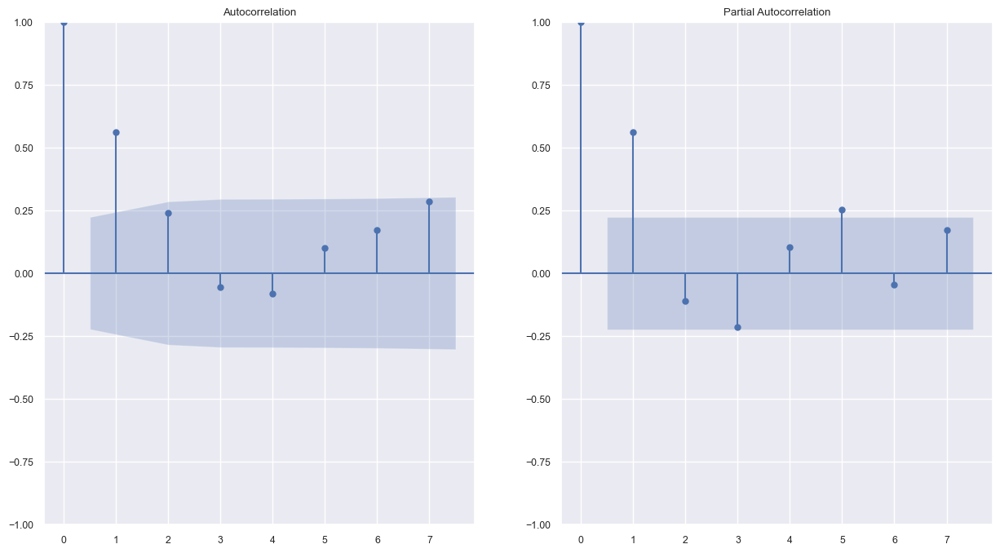

In [68]:
fig, axes = plt.subplots(1, 2, figsize=(15, 8))

#create series with date as index and count as values
df_dates = df.groupby('Date').size().reset_index(name='Counts')

fig = sm.graphics.tsa.plot_acf(df_dates['Counts'], lags=7, ax=axes[0])
fig = sm.graphics.tsa.plot_pacf(df_dates['Counts'], lags=7, ax=axes[1], method='ywm')

In [69]:
result = adfuller(df_dates["Counts"])
print("ADF Stat: ", result[0], "\np value: ", result[1], " \n Critical Values:\n   1%: ", result[4].get("1%"))
print("   5%: ", result[4].get("5%"))
print("   10%: ", result[4].get("10%"))

ADF Stat:  -2.614772154467495 
p value:  0.08998243655330129  
 Critical Values:
   1%:  -3.524624466842421
   5%:  -2.9026070739026064
   10%:  -2.5886785262345677


There is a low correlation between job posting counts on the same days of the week. This correlation may be higher if the busier and less busy seasons are analysed seperately. However, the ADF fuller test suggests that the series is stationary. The ADF stat is negative and larger than the threshold as all critical values, with a p value of 0.7%.

In [70]:
df.head()
#inspect Requirement column for different data types
print(df['Requirement'].apply(type).value_counts())
#inspect Requirement column for NULL VALUES 
print(df['Requirement'].isnull().sum())
#convert to string
df['Requirement'] = df['Requirement'].astype(str)

<class 'str'>      183521
<class 'float'>         2
Name: Requirement, dtype: int64
2


In [71]:
# Create custom stop word list based on common words in Requirement column which do not hold syntactic value
stop_words = stopwords.words('english')
custom_stop_words = ["join", "opportunity", "looking", "we", "career", "work", 
                     "seeking", "exciting", "experienced", "experience", "great", 
                     "role", "love", "start", "company", "new", "team", "a", 
                     "hour", "week", "full", "part", "time", "immediate", "based", 
                     "currently", "position", "per", "staff", "within", "available", "month"]
stop_words.extend(custom_stop_words)

In [72]:
grouped_df = df.groupby('Classification')

# Create a dictionary to store the smaller dataframes
dfs = {}

# Create a list of classification strings
classifications = df['Classification'].unique()
classifications = [x for x in classifications if str(x) != 'nan']

# Iterate over each group and store the corresponding dataframe in the dictionary
for classification, group_df in grouped_df:
    dfs[classification] = group_df.copy()

# Iterate over each entry in each group and remove entries with no 'Requirement' value
for classification in classifications:
    dfs[classification].dropna(subset=['Requirement'], inplace=True)
    dfs[classification] = dfs[classification][dfs[classification]['Requirement'].str.strip().astype(bool)]
    dfs[classification] = dfs[classification][dfs[classification]['Requirement'].str.len() > 10]

# Tokenize the Requirement column in each dataframe
for classification in classifications:
    dfs[classification]['Requirement'] = dfs[classification]['Requirement'].apply(nltk.word_tokenize)

# Split tokens by '/' then remove other punctuation
for classification in classifications:
    dfs[classification]['Requirement'] = dfs[classification]['Requirement'].apply(lambda x: [subitem.strip().replace('/', '') for item in x for subitem in item.split('/')])
    dfs[classification]['Requirement'] = dfs[classification]['Requirement'].apply(lambda x: [word for word in x if word.isalpha()])

# Remove stop words using NLTK's stopwords list
for classification in classifications:
    dfs[classification]['Requirement'] = dfs[classification]['Requirement'].apply(lambda x: [word.lower() for word in x])
    dfs[classification]['Requirement'] = dfs[classification]['Requirement'].apply(lambda x: [WordNetLemmatizer().lemmatize(word) for word in x])
    dfs[classification]['Requirement'] = dfs[classification]['Requirement'].apply(lambda x: [word for word in x if word not in stop_words])

# Compute TF-IDF for each classification
TFIDFdfs = {}
vectorizers = {}
for classification in classifications:
    vectorizer = TfidfVectorizer(lowercase=False, analyzer=lambda x: x)
    TFIDFdfs[classification] = vectorizer.fit_transform(dfs[classification]['Requirement']).toarray()
    vectorizers[classification] = vectorizer

# Convert the TF-IDF matrix to DataFrame
for classification in classifications:
    feature_names = vectorizers[classification].get_feature_names_out()
    TFIDFdfs[classification] = pd.DataFrame(data=TFIDFdfs[classification], columns=feature_names)


In [73]:
# show all keys in TFIDFdfs
TFIDFdfs.keys()
# classifications
classifications

['Retail & Consumer Products',
 'Call Centre & Customer Service',
 'Hospitality & Tourism',
 'Banking & Financial Services',
 'Manufacturing, Transport & Logistics',
 'Sales',
 'Administration & Office Support',
 'Trades & Services',
 'Accounting',
 'Real Estate & Property',
 'Healthcare & Medical',
 'Marketing & Communications',
 'Government & Defence',
 'Information & Communication Technology',
 'Education & Training',
 'Community Services & Development',
 'Mining, Resources & Energy',
 'Human Resources & Recruitment',
 'Insurance & Superannuation',
 'Engineering',
 'CEO & General Management',
 'Design & Architecture',
 'Legal',
 'Construction',
 'Sport & Recreation',
 'Science & Technology',
 'Advertising, Arts & Media',
 'Farming, Animals & Conservation',
 'Self Employment',
 'Consulting & Strategy']

In [74]:
def get_top_n_words(dataframe, n=None):
    avg_tfidf = dataframe.mean(axis=0)
    top_n = avg_tfidf.nlargest(n)
    return top_n

df_top_words = pd.DataFrame()

for sector in TFIDFdfs:
    # if sector in TFIDFdfs:  # ensure that the sector exists in the dictionary
        top_20_words = get_top_n_words(TFIDFdfs[sector], 20)
        df_top_words[sector] = pd.Series(top_20_words.index)

# Save DataFrame to csv
df_top_words.to_csv('TFIDF_words.csv', index=False)


Entire word processing to IDF situation from start to finish in one cell

In [75]:
grouped_df = df.groupby('SubClassification')

# Create a dictionary to store the smaller dataframes
dfs = {}

# Create a list of sub-classification strings
sub_classifications = df['SubClassification'].unique()
sub_classifications = [x for x in sub_classifications if str(x) != 'nan']

# Iterate over each group and store the corresponding dataframe in the dictionary
for sub_classification, group_df in grouped_df:
    dfs[sub_classification] = group_df.copy()

# Iterate over each entry in each group and remove entries with no 'Requirement' value
for sub_classification in sub_classifications:
    dfs[sub_classification].dropna(subset=['Requirement'], inplace=True)
    dfs[sub_classification] = dfs[sub_classification][dfs[sub_classification]['Requirement'].str.strip().astype(bool)]
    dfs[sub_classification] = dfs[sub_classification][dfs[sub_classification]['Requirement'].str.len() > 10]

# Tokenize the Requirement column in each dataframe
for sub_classification in sub_classifications:
    dfs[sub_classification]['Requirement'] = dfs[sub_classification]['Requirement'].apply(nltk.word_tokenize)

# Split tokens by '/' then remove other punctuation
for sub_classification in sub_classifications:
    dfs[sub_classification]['Requirement'] = dfs[sub_classification]['Requirement'].apply(lambda x: [subitem.strip().replace('/', '') for item in x for subitem in item.split('/')])
    dfs[sub_classification]['Requirement'] = dfs[sub_classification]['Requirement'].apply(lambda x: [word for word in x if word.isalpha()])

# Remove stop words using NLTK's stopwords list
for sub_classification in sub_classifications:
    dfs[sub_classification]['Requirement'] = dfs[sub_classification]['Requirement'].apply(lambda x: [word.lower() for word in x])
    dfs[sub_classification]['Requirement'] = dfs[sub_classification]['Requirement'].apply(lambda x: [WordNetLemmatizer().lemmatize(word) for word in x])
    dfs[sub_classification]['Requirement'] = dfs[sub_classification]['Requirement'].apply(lambda x: [word for word in x if word not in stop_words])

# Compute TF-IDF for each sub_classification
TFIDFdfs = {}
vectorizers = {}
for sub_classification in sub_classifications:
    vectorizer = TfidfVectorizer(lowercase=False, analyzer=lambda x: x)
    TFIDFdfs[sub_classification] = vectorizer.fit_transform(dfs[sub_classification]['Requirement']).toarray()
    vectorizers[sub_classification] = vectorizer

# Convert the TF-IDF matrix to DataFrame
for sub_classification in sub_classifications:
    feature_names = vectorizers[sub_classification].get_feature_names_out()
    TFIDFdfs[sub_classification] = pd.DataFrame(data=TFIDFdfs[sub_classification], columns=feature_names)


In [76]:

# function to get top n words from classification or subclassification following TF-IDF
def print_top_n_words(dataframe, n=None, classification=None):
        print(f"Classification: {classification}")
        avg_tfidf = dataframe[classification].mean(axis=0)
        print("10 words with the highest average TF-IDF:")
        print(avg_tfidf.nlargest(20))
        print("\n")
# Print the words with the highest and lowest TF-IDF on average
print_top_n_words(TFIDFdfs, 20, 'Business/Systems Analysts')

Classification: Business/Systems Analysts
10 words with the highest average TF-IDF:
business        0.071145
analyst         0.067929
contract        0.042936
project         0.036230
large           0.027970
client          0.027661
data            0.027013
senior          0.026109
government      0.024531
system          0.023876
cbd             0.022517
organisation    0.022126
technical       0.021395
service         0.020999
ba              0.019849
leading         0.019747
program         0.019597
required        0.018370
financial       0.018033
process         0.017811
dtype: float64




In [77]:
# Plot and display an interactive visualisation of bar to pie charts.
def make_interactive_pie_bar(df, category1, initial_slice1, subcategory1, category2, initial_slice2, subcategory2):
    app = dash.Dash(__name__, external_stylesheets=[dbc.themes.LUX])

    app.layout = html.Div([
        html.Br(),
        html.H2('\nWelcome to an interactive data experience', style={'textAlign': 'center', 'font-family': 'Arial'}),
        html.Br(),
        html.P('On this page you may interact with visualisations extracted from data of job postings on seek.com\n', style={'textAlign': 'center', 'font-family': 'Arial'}),
        # First section
        html.Br(),
        html.H3('Job Classification & SubClassification', style={'textAlign': 'center', 'font-family': 'Arial'}),
        html.P('click on a pie wedge you would like to investigate and the subclassifications will be displayed.', style={'textAlign': 'center', 'font-family': 'Arial'}),
        dcc.Graph(id='pie-chart-1', 
                figure=go.Figure(data=[go.Pie(labels=df[category1].value_counts().index.tolist(),
                                                values=df[category1].value_counts().values.tolist())])
                            .update_layout(height=600, width=1200)),

        dcc.Graph(id='bar-chart-1'),
        # Second section
        html.H3('Locations and SubClassifications', style={'textAlign': 'center', 'font-family': 'Arial'}),
        html.P('click on a pie wedge you would like to investigate and the subclassifications will be displayed.', style={'textAlign': 'center', 'font-family': 'Arial'}),
        dcc.Graph(id='pie-chart-2', 
                figure=go.Figure(data=[go.Pie(labels=df[category2].value_counts().index.tolist(),
                                                values=df[category2].value_counts().values.tolist(),
                                                textinfo='none')])
                            .update_layout(height=600, width=1200)),

        dcc.Graph(id='bar-chart-2')
    ])

    @app.callback(
        Output('bar-chart-1', 'figure'),
        Input('pie-chart-1', 'clickData'))
    def update_bar_chart_1(clickData):
        if clickData is None:
            slice = initial_slice1
        else:
            slice = clickData['points'][0]['label']
        ratios = df[df[category1] == slice][subcategory1].value_counts(normalize=True).values.tolist()
        labels = df[df[category1] == slice][subcategory1].value_counts(normalize=True).index.tolist()
        fig = go.Figure(data=[go.Bar(x=labels, y=ratios)]).update_layout(title_text=slice)
        fig.update_yaxes(tickformat=".0%")
        return fig

    @app.callback(
        Output('bar-chart-2', 'figure'),
        Input('pie-chart-2', 'clickData'))
    def update_bar_chart_2(clickData):
        if clickData is None:
            slice = initial_slice2
        else:
            slice = clickData['points'][0]['label']
        ratios = df[df[category2] == slice][subcategory2].value_counts(normalize=True).values.tolist()
        labels = df[df[category2] == slice][subcategory2].value_counts(normalize=True).index.tolist()
        fig = go.Figure(data=[go.Bar(x=labels, y=ratios)])
        fig.update_layout(title_text=slice)
        fig.update_yaxes(tickformat=".0%")
        return fig

    return app

if __name__ == '__main__':
    app = make_interactive_pie_bar(df, 'ClassificationLumped', 'Hospitality & Tourism', 'SubClassification', 'Location', 'Sydney', 'SubClassification')
    app.run_server(debug=True, use_reloader=False)


Dash is running on http://127.0.0.1:8050/

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: on
